# **Logistic regression**

На данных по индивидам [Российского мониторинга экономического положения и здоровья населения НИУ ВШЭ](https://www.hse.ru/rlms/) за [2024 год (33 волна)](https://www.hse.ru/rlms/spss) попробуем на основании логистической регрессии построить модель прогноза размера заработной платы (более 30 тыс. руб.? да - 0/нет - 1) физического лица по его социально-экономическим характеристикам.

In [1]:
# Установка пакетов
!pip install category_encoders

In [2]:
# Ипортируем библиотеки
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import OneHotEncoder
from category_encoders import LeaveOneOutEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import f1_score # f1 score
from sklearn.metrics import accuracy_score # для вычисления accuracy
from sklearn.metrics import recall_score # recall
from sklearn.metrics import precision_score # precision
from sklearn.metrics import confusion_matrix # матрица ошибок

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import validation_curve

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Изменим значение максимального количества отображаемых строк и столбцов
pd.options.display.max_columns = 50
pd.options.display.max_rows = 100
# Поменяем формат вывода чисел: разделим разряды запятой и будем выводить два знака после точки
pd.options.display.float_format = '{:,.2f}'.format

In [4]:
# Зададим параметры, которые будут использоваться в расчетах ниже.
random_state=12345

# Для расшифровки полей датасета исп. https://www.hse.ru/rlms/code ф. "Описание переменных файла данных по индивидам" для Волна 33 (2024 г.)
# Список используемых колонок
features = ['ccid_i', 'cc_int_y', 'cch5', 'cc_age', 'cc_marst', 'ccj72_171', 'ccj72_172', 'ccj72_173', 'cc_diplom', \
         'ccj260', 'ccj262', 'ccj161_3y', 'ccj161_3m', 'ccj5a', 'ccj5b', 'ccj6_2', 'region', 'status', 'cc_occup08', \
         'ccj4_1', 'ccj6', 'ccj6_0', 'ccj11', 'ccj13', 'ccj23', 'ccm20_7', 'ccj77', 'ccj90', 'ccs7', 'ccj13_2',\
         'ccj10', 'ccj60']

# Словарь для кодирования переменной "Пол респондента" (cch5)
cch5_d = {1: "male", 2: "female"}
# Словарь для кодирования переменной "Семейное положение" (cc_marst)
cc_marst_d = {
    1: "Никогда в браке не состояли",
    2: "Состоите в зарегистрированном браке",
    3: "Живете вместе, но не зарегистрированы",
    4: "Разведены и в браке не состоите",
    5: "Вдовец (вдова)",
    6: "Официально зарегистрированы, но вместе не проживают",
    99999997: "ЗАТРУДНЯЮСЬ ОТВЕТИТЬ",
    99999998: "ОТКАЗ ОТ ОТВЕТА",
    99999999: "НЕТ ОТВЕТА"
}
# Словарь 2 для кодирования переменной "Семейное положение" (cc_marst)
cc_marst_d_f = {
    1: "not_married",
    2: "married",
    3: "not_married",
    4: "not_married",
    5: "not_married",
    6: "married",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь для кодирования переменной "Наличие детей" (ccj72_171)
ccj72_171_d = {1: "yes", 2: "no", 99999997: "unknown", 99999998: "unknown", 99999999: "unknown"}
# Словарь для кодирования переменной "Образование (группа)" (cc_diplom)
cc_diplom_d = {
    1: "окончил 0 - 6 классов",
    2: "незаконченное среднее образование (7 - 8 кл)",
    3: "незаконченное среднее образов. (7 - 8 кл) + что-то еще",
    4: "законченное среднее образование",
    5: "законченное среднее специальное образование",
    6: "законченное высшее образование и выше",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь 2 для кодирования переменной "Образование (группа)" (cc_diplom)
cc_diplom_d_f = {
    1: "no",
    2: "no",
    3: "no",
    4: "no",
    5: "no",
    6: "yes",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь для кодирования переменной "законченное бразование" (cc_educ)
diplom_years_map = {
    1: 6,   # окончил 0–6 классов
    2: 8,   # незаконченное среднее (7–8 кл)
    3: 9,   # незаконченное среднее (7–8 кл) + что-то ещё
    4: 11,  # законченное среднее образование
    5: 13,  # законченное среднее специальное образование
    6: 16,  # законченное высшее образование и выше
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь для кодирования переменной "Владение иностранным языком" (ccj260 )
ccj260_d = {
    1: "yes",
    2: "no",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь для кодирования переменной "Тип населенного пункта" (status)
status_d = {1: "center_area", 2: "city", 3: "urban_village", 4: "village"}
# Словарь для кодирования переменной "Профессиональная группа" (cc_occur08)
cc_occur08 = {
    0: "военнослужащие",
    1: "законодатели; крупные чиновники; руководители высш. и сред. звена",
    2: "специалисты высшего уровня квалификации",
    3: "специалисты среднего уровня квалификации; чиновники",
    4: "служащие офисные и по обслуживанию клиентов",
    5: "работники сферы торговли и услуг",
    6: "квалифицированные работники сельского, лесного хоз-ва и рыбоводства",
    7: "квалифицированные рабочие, занятые ручным трудом",
    8: "квалифицированные рабочие, использующие машины и механизмы",
    9: "неквалифицированные рабочие всех отраслей",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь для кодирования переменной "Наличие подчиненных" (ccj6)
ccj6_d = {
    1: "yes",
    2: "no",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}
# Словарь для кодирования переменной "Тип занятости" (ccj11)
ccj11_d = {
    1: "enterprise",
    2: "not_enterprise",
    3: "self_employed",
    4: "individual",
    99999997: "unknown",
    99999998: "unknown",
    99999999: "unknown"
}

## **Сбор данных**

In [5]:
%%time
# Загрузим датасет с GitHub
url = "https://raw.githubusercontent.com/eilicheva-art/datasets/refs/heads/main/ind_rlms_2024.csv"
df = pd.read_csv(url, on_bad_lines='skip', sep=';')
# Оставим только нужные колонки
df = df[features]
# Выведим первые 5 строк датафрейма
df.head()

CPU times: user 1.11 s, sys: 188 ms, total: 1.3 s
Wall time: 1.8 s


,ccid_i,cc_int_y,cch5,cc_age,cc_marst,ccj72_171,ccj72_172,ccj72_173,cc_diplom,ccj260,ccj262,ccj161_3y,ccj161_3m,ccj5a,ccj5b,ccj6_2,region,status,cc_occup08,ccj4_1,ccj6,ccj6_0,ccj11,ccj13,ccj23,ccm20_7,ccj77,ccj90,ccs7,ccj13_2,ccj10,ccj60
0,"1,008,401.00","2,025.00",2.00,66.00,2.00,1.00,3.00,0.00,4.00,2.00,NaN,41.00,1.00,NaN,NaN,NaN,1.00,4.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,2.00,4.00,1.00,NaN,NaN,"27,000.00"
1,"1,008,801.00","2,025.00",2.00,71.50,5.00,1.00,3.00,0.00,4.00,2.00,NaN,40.00,0.00,NaN,NaN,NaN,1.00,4.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,2.00,4.00,1.00,NaN,NaN,"26,000.00"
2,"1,008,901.00","2,025.00",2.00,62.50,5.00,1.00,2.00,0.00,4.00,2.00,NaN,29.00,0.00,NaN,NaN,NaN,1.00,4.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00,2.00,4.00,1.00,NaN,NaN,"26,000.00"
3,"1,010,801.00","2,024.00",2.00,61.00,2.00,1.00,3.00,0.00,4.00,2.00,NaN,42.00,0.00,"2,023.00",11.00,"99,999,997.00",1.00,4.00,5.00,2.00,2.00,NaN,1.00,150.00,"99,999,997.00",2.00,1.00,12.00,1.00,"20,000.00","22,000.00","47,300.00"
4,"1,010,802.00","2,024.00",1.00,55.50,2.00,1.00,3.00,0.00,4.00,2.00,NaN,35.00,0.00,"2,024.00",7.00,45.00,1.00,4.00,5.00,2.00,2.00,NaN,1.00,"99,999,997.00",1.00,2.00,1.00,12.00,1.00,"45,000.00","50,000.00","50,000.00"


In [6]:
# Выведим общую информацию о датафрейме
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12000 entries, 0 to 11999
Data columns (total 32 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ccid_i      12000 non-null  float64
 1   cc_int_y    12000 non-null  float64
 2   cch5        12000 non-null  float64
 3   cc_age      12000 non-null  float64
 4   cc_marst    10303 non-null  float64
 5   ccj72_171   10303 non-null  float64
 6   ccj72_172   7445 non-null   float64
 7   ccj72_173   7445 non-null   float64
 8   cc_diplom   10303 non-null  float64
 9   ccj260      10303 non-null  float64
 10  ccj262      1823 non-null   float64
 11  ccj161_3y   9107 non-null   float64
 12  ccj161_3m   8356 non-null   float64
 13  ccj5a       5387 non-null   float64
 14  ccj5b       5387 non-null   float64
 15  ccj6_2      5387 non-null   float64
 16  region      12000 non-null  float64
 17  status      12000 non-null  float64
 18  cc_occup08  5387 non-null   float64
 19  ccj4_1      5387 non-null

Итак, для построения модели предсказания заработной платы собрали 30 колонок, из них

 - фичи (20 шт.): `cch5` - пол респондента; `cc_age` - возраст респондента; `cc_marst` - семейное положение; `ccj72_171` - есть ли дети;`ccj72_172` - количество детей; `ccj72_173` - количество детей моложе 18 лет; `cc_diplom` - законченное образование (группа);  `ccj260` -  владение иностранным языком; `ccj262` - степень владения иностранным языком; `ccj161_3y` - стаж всего (лет); `ccj161_3m` - стаж всего (мес); `ccj5a` - стаж на текущем месте работы (лет); `ccj5b` - стаж на текущем месте работы (мес);`ccj6_2` -средняя продолжительность рабочей недели; `region` - регион; `status` - тип населенного пункта; `cc_occup08` - профессиональная группа; `ccj4_1` - в какой отрасли вы работаете на этой работе?; `ccj6_0` - количество подчиненных; `ccj6` -у вас есть подчиненные на этой работе?; `ccj11` - тип занятости (организация/самозанятость); `ccj13` - сколько человек работает на вашем предприятии? если не знаете точно, скажите примерно; `ccj23` - является государство владельцем или совладельцем вашего предприятия, организации?.

 - варианты таргета (3 шт.): `ccj13_2` - среднемесячная зарплата за последние 12 месяцев; `ccj10` - зарплата за последние 30 дней по основной работе (после вычета налогов); `ccj60` - совокупный личный доход за последние 30 дней.

 - переменные для фильтрации (4 шт.): `ccm20_7` - какая группа инвалидности вам назначена?; `ccj77` - есть ли работа у респондента?; `ccj90` - какой ответ лучше всего описывает ваше основное занятие в настоящее время?; `ccs7` - отметьте, насколько по-вашему мнению надежна получаемая информация.

In [7]:
# Проведем предварительную фильтрацию датафрейма
df = df[df['ccm20_7']==2] # отфильтруем неинвалидов
df = df[df['ccj77']==1] # отфильтруем только имеющих работу
df = df[(df['ccj90']>=10)&(df['ccj90']<=13)] # отфильтруем только работающих, предпринемателей, фермеров (исключим учеников, пенсионеров, студентов, ...)
df = df[df['ccs7']==1] # отфильтруем только надежную информацию
# Удалим далее неинформативные столбцы
del df['ccm20_7']
del df['ccj77']
del df['ccj90']
del df['ccs7']
# Выведим первые 5 строк датафрейма
df.head()

,ccid_i,cc_int_y,cch5,cc_age,cc_marst,ccj72_171,ccj72_172,ccj72_173,cc_diplom,ccj260,ccj262,ccj161_3y,ccj161_3m,ccj5a,ccj5b,ccj6_2,region,status,cc_occup08,ccj4_1,ccj6,ccj6_0,ccj11,ccj13,ccj23,ccj13_2,ccj10,ccj60
3,"1,010,801.00","2,024.00",2.00,61.00,2.00,1.00,3.00,0.00,4.00,2.00,NaN,42.00,0.00,"2,023.00",11.00,"99,999,997.00",1.00,4.00,5.00,2.00,2.00,NaN,1.00,150.00,"99,999,997.00","20,000.00","22,000.00","47,300.00"
4,"1,010,802.00","2,024.00",1.00,55.50,2.00,1.00,3.00,0.00,4.00,2.00,NaN,35.00,0.00,"2,024.00",7.00,45.00,1.00,4.00,5.00,2.00,2.00,NaN,1.00,"99,999,997.00",1.00,"45,000.00","50,000.00","50,000.00"
5,"1,010,803.00","2,024.00",1.00,43.00,1.00,2.00,NaN,NaN,3.00,2.00,NaN,10.00,0.00,"2,024.00",9.00,"99,999,997.00",1.00,4.00,7.00,"99,999,999.00",2.00,NaN,1.00,"99,999,997.00",1.00,0.00,NaN,0.00
9,"9,000,503.00","2,024.00",2.00,37.50,2.00,1.00,1.00,1.00,6.00,1.00,3.00,18.00,0.00,"2,023.00",5.00,40.00,9.00,1.00,3.00,11.00,2.00,NaN,1.00,20.00,1.00,"45,000.00","45,000.00","45,000.00"
12,"9,005,501.00","2,024.00",2.00,59.50,4.00,1.00,2.00,0.00,5.00,2.00,NaN,33.00,0.00,"1,991.00",9.00,40.00,9.00,1.00,5.00,14.00,2.00,NaN,4.00,NaN,NaN,NaN,"60,000.00","75,700.00"


In [8]:
# Выведим количество строк датафрейма после фильтрации
print("Количество строк:", df.shape[0])
# Выведим количество уникальных id респондентов
print("Количество уникальных респондентов:", len(df['ccid_i'].unique()))

Количество строк: 5047
Количество уникальных респондентов: 5047


## **Предобработка данных**

### **Изучение отдельных признаков**

#### **Выбор таргета**

##### **ccj13_2 (среднемесячная зарплата за последние 12 месяцев)**

In [9]:
# Выведим статистику по различным пропускам переменной ccj13_2
print(df[df['ccj13_2'] == 99999997].shape[0]) # ЗАТРУДНЯЮСЬ ОТВЕТИТЬ
print(df[df['ccj13_2'] == 99999998].shape[0]) # ОТКАЗ ОТ ОТВЕТА
print(df[df['ccj13_2'] == 99999999].shape[0]) # НЕТ ОТВЕТА
print(df[df['ccj13_2'].isnull()==True].shape[0]) # не заполнено

139
90
30
587


In [10]:
# Заполним пропуски
df.loc[df['ccj13_2'].isnull()==True, 'ccj13_2'] = 'unknown'
df.loc[df['ccj13_2'] == 99999997, 'ccj13_2'] = 'unknown'
df.loc[df['ccj13_2'] == 99999998, 'ccj13_2'] = 'unknown'
df.loc[df['ccj13_2'] == 99999999, 'ccj13_2'] = 'unknown'

In [11]:
# Проверка
df[df['ccj13_2'].isnull()==True].shape[0]

0

In [12]:
# Проверка
df[df['ccj13_2']=='unknown'].shape[0]

846

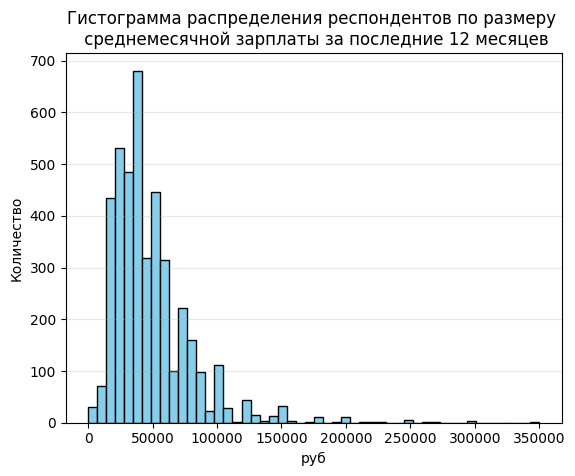

In [13]:
# Построим гистограмму ccj13_2
plt.hist(df[df['ccj13_2']!='unknown']['ccj13_2'], bins=50, edgecolor='black', color='skyblue') # Гистограмма с 50 столбцами
plt.title('Гистограмма распределения респондентов по размеру \n среднемесячной зарплаты за последние 12 месяцев')
plt.xlabel('руб')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show()

Итак, переменная содержит 846 пропусков (категория "unknown").

##### **ccj10 (зарплата за последние 30 дней по основной работе)**

In [14]:
# Выведим статистику по различным пропускам переменной ccj10
print(df[df['ccj10'] == 99999997].shape[0]) # ЗАТРУДНЯЮСЬ ОТВЕТИТЬ
print(df[df['ccj10'] == 99999998].shape[0]) # ОТКАЗ ОТ ОТВЕТА
print(df[df['ccj10'] == 99999999].shape[0]) # НЕТ ОТВЕТА
print(df[df['ccj10'].isnull()==True].shape[0]) # не заполнено

15
110
15
91


In [15]:
# Заполним пропуски
df.loc[df['ccj10'].isnull()==True, 'ccj10'] = 'unknown'
df.loc[df['ccj10'] == 99999997, 'ccj10'] = 'unknown'
df.loc[df['ccj10'] == 99999998, 'ccj10'] = 'unknown'
df.loc[df['ccj10'] == 99999999, 'ccj10'] = 'unknown'

In [16]:
# Проверка
df[df['ccj10'].isnull()==True].shape[0]

0

In [17]:
# Проверка
df[df['ccj10']=='unknown'].shape[0]

231

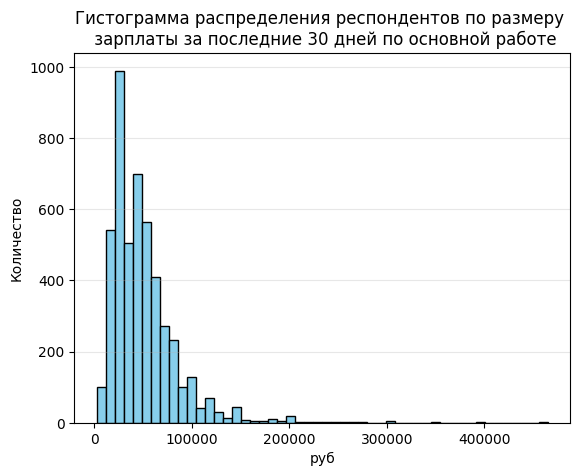

In [18]:
# Построим гистограмму ccj10
plt.hist(df[df['ccj10']!='unknown']['ccj10'], bins=50, edgecolor='black', color='skyblue') # Гистограмма с 50 столбцами
plt.title('Гистограмма распределения респондентов по размеру \n зарплаты за последние 30 дней по основной работе')
plt.xlabel('руб')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show()

Переменная содержит 231 пропуск (категория "unknown").

##### **ccj60 - совокупный личный доход за последние 30 дней**

In [19]:
# Выведим статистику по различным пропускам переменной ccj60
print(df[df['ccj60'] == 99999997].shape[0]) # ЗАТРУДНЯЮСЬ ОТВЕТИТЬ
print(df[df['ccj60'] == 99999998].shape[0]) # ОТКАЗ ОТ ОТВЕТА
print(df[df['ccj60'] == 99999999].shape[0]) # НЕТ ОТВЕТА
print(df[df['ccj60'].isnull()==True].shape[0]) # не заполнено

19
114
3
0


In [20]:
# Заполним пропуски
df.loc[df['ccj60'].isnull()==True, 'ccj60'] = 'unknown'
df.loc[df['ccj60'] == 99999997, 'ccj60'] = 'unknown'
df.loc[df['ccj60'] == 99999998, 'ccj60'] = 'unknown'
df.loc[df['ccj60'] == 99999999, 'ccj60'] = 'unknown'

In [21]:
# Проверка
df[df['ccj60'].isnull()==True].shape[0]

0

In [22]:
# Проверка
df[df['ccj60']=='unknown'].shape[0]

136

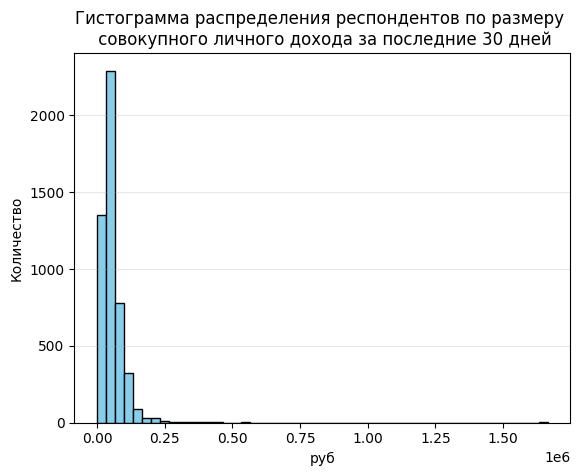

In [23]:
# Построим гистограмму ccj60
plt.hist(df[df['ccj60']!='unknown']['ccj60'], bins=50, edgecolor='black', color='skyblue') # Гистограмма с 50 столбцами
plt.title('Гистограмма распределения респондентов по размеру \n совокупного личного дохода за последние 30 дней')
plt.xlabel('руб')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show()

Переменная содержит 136 пропусков (категория "unknown").

##### **ccj13_2, ccj10, ccj60 - совместный анализ**

In [24]:
# Построим парные корреляции Пирсона между ccj13_2, ccj10, ccj60
df[(df['ccj13_2']!='unknown')&(df['ccj10']!='unknown')&(df['ccj60']!='unknown')][['ccj13_2', 'ccj10', 'ccj60']].corr()

,ccj13_2,ccj10,ccj60
ccj13_2,1.00,0.96,0.72
ccj10,0.96,1.00,0.75
ccj60,0.72,0.75,1.00


Видим сильную прямую линейную связь между ccj13_2 (среднемесячная зарплата за последние 12 месяцев)
и ccj10 (зарплата за последние 30 дней на основной работе). Оставим для дальнейшего анализа в качестве таргета ccj10(зарплата за последние 30 дней по основной работе), как наиболее оперативный показатель (и с меньшим, чем у ccj13_2 количеством пропусков) и удалим пропуски (категорию 'unknown') по этой переменной.

In [25]:
# Удалим столбцы
del df['ccj13_2']
del df['ccj60']
# Удалим в df строки, где ccj10 == 'unknown'
df = df[df['ccj10']!='unknown']
df['ccj10'] = df['ccj10'].astype('float') # изменим тип данных
# Выведим количество строк датафрейма после удаления пропусков по выбранному таргету
df.shape[0]

4816

In [26]:
# Выведим описательные статистики таргета
df['ccj10'].describe()

,ccj10
count,"4,816.00"
mean,"49,910.56"
std,"35,083.73"
min,"3,000.00"
25%,"28,000.00"
50%,"40,000.00"
75%,"60,000.00"
max,"465,000.00"


In [27]:
# Закодируем целевую переменную (1 - зп менее 30 тыс. руб., 0 - зп более 30 тыс. руб)
df['ccj10_cat'] = np.where(df['ccj10'] <= 30000, 1, 0)
# Выведим содержимое столбца ccj10_cat
df['ccj10_cat'].value_counts()

,count
ccj10_cat,
0,3188
1,1628


#### **Изучение и предобработка фичей**

##### **cch5 (пол)**

In [28]:
# Категоризуем переменную cch5 с помощью словаря cch5_d
df['cch5_cat'] = df['cch5'].map(cch5_d)
# Удалим переменную cch5
del df['cch5']
# Выведим содержимое столбца cch5_cat
print(df['cch5_cat'].value_counts()/df.shape[0])

cch5_cat
female   0.53
male     0.47
Name: count, dtype: float64


Категоризовали переменную "Пол респондента". Переменная не содержит пропусков. В дальнейшем перед моделированием применим OneHotEncoder для получения дамми.

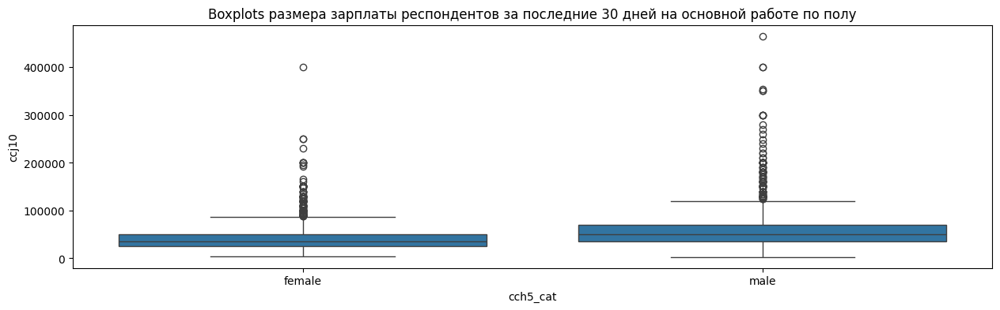

In [29]:
# Построим ящичковые диаграммы распределения зп по cch5_cat
plt.figure(figsize=(15, 4))
sns.boxplot(x='cch5_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по полу')
plt.xlabel('cch5_cat')
plt.ylabel('ccj10')
plt.show();

Медианная зарплата в группе мужчин выше, чем в группе женщин.

In [30]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по полу
df.pivot_table(index=['cch5_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
cch5_cat,,
female,2531,0.44
male,2285,0.22


Доля людей с зп менее 30 тыс. руб. в группе женщин составила 0.44, в группе мужчин - 0.22.

##### **cc_age (возраст)**

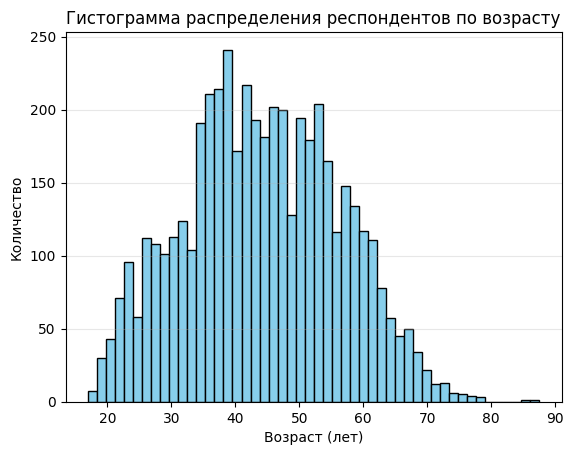

In [31]:
# Построим гистограмму для cc_age
plt.hist(df['cc_age'], bins=50, edgecolor='black', color='skyblue')
plt.title('Гистограмма распределения респондентов по возрасту')
plt.xlabel('Возраст (лет)')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show();

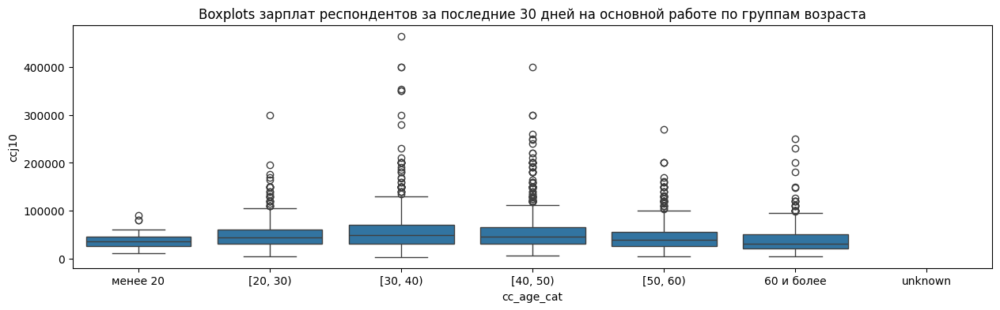

In [32]:
# Категаризуем переменную cc_age
def categorize_cc_age(row):
    """Функция категоризации cc_age"""
    if row['cc_age']<20:
        return 'менее 20'
    elif row['cc_age']<30:
        return '[20, 30)'
    elif row['cc_age']<40:
        return '[30, 40)'
    elif row['cc_age']<50:
        return '[40, 50)'
    elif row['cc_age']<60:
        return '[50, 60)'
    elif row['cc_age']>=60:
        return '60 и более'
    elif row['cc_age'] == 'unknown':
        return 'unknown'

# Создадим категоризованный столбец cc_age_cat
df['cc_age_cat']  = df.apply(categorize_cc_age, axis=1)

order = ['менее 20', '[20, 30)', '[30, 40)', '[40, 50)', '[50, 60)', '60 и более', 'unknown']
# Построим ящичковые диаграммы распределения зп респондентов по возрасту
plt.figure(figsize=(15, 4))
sns.boxplot(x='cc_age_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots зарплат респондентов за последние 30 дней на основной работе по группам возраста')
plt.xlabel('cc_age_cat')
plt.ylabel('ccj10')
plt.show();

Видим, что связь медианной зарплаты и возраста не похоже на линейную. Медианная зарплата в группах с ростом возраста возрастает до 30-40 лет, а затем начинает убывать.

In [33]:
# Удалим cc_age
del df['cc_age']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по возрасту
df.pivot_table(index=['cc_age_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
cc_age_cat,,
60 и более,519,0.53
"[20, 30)",589,0.31
"[30, 40)",1198,0.28
"[40, 50)",1357,0.29
"[50, 60)",1116,0.39
менее 20,37,0.46


Доля людей с зп менее 30 тыс. руб. с ростом возраста до 30-40 лет снижается, а затем начинает расти. В дальнейшем перед моделированием применим LeaveOneOutEncoder к cc_age_cat.

##### **cc_marst (семейное положение)**

In [34]:
# Категоризуем переменную cc_marst
df['cc_marst_cat'] = df['cc_marst'].map(cc_marst_d)
# Выведим содержимое столбца cc_marst
print(df['cc_marst_cat'].value_counts())

cc_marst_cat
Состоите в зарегистрированном браке                    2657
Никогда в браке не состояли                             820
Живете вместе, но не зарегистрированы                   543
Разведены и в браке не состоите                         508
Вдовец (вдова)                                          245
Официально зарегистрированы, но вместе не проживают      29
ОТКАЗ ОТ ОТВЕТА                                           9
ЗАТРУДНЯЮСЬ ОТВЕТИТЬ                                      4
НЕТ ОТВЕТА                                                1
Name: count, dtype: int64


In [35]:
# Категоризуем итогово переменную cc_marst (married/not_married)
df['cc_marst_cat'] = df['cc_marst'].map(cc_marst_d_f)
# Заполним пропуски
df.loc[df['cc_marst'].isnull()==True, 'cc_marst_cat'] = 'unknown'
# Удалим переменную cc_marst
del df['cc_marst']
# Выведим содержимое столбца cc_marst_cat
print(df['cc_marst_cat'].value_counts())

cc_marst_cat
married        2686
not_married    2116
unknown          14
Name: count, dtype: int64


In [36]:
# Проверка
df[df['cc_marst_cat'].isnull()==True].shape[0]

0

Категоризовали переменную "Семейное положение". Переменная содержит 14 пропусков (категория "unknown"). В дальнейшем перед моделированием переменной применим OneHotEncoder для получения дамми.

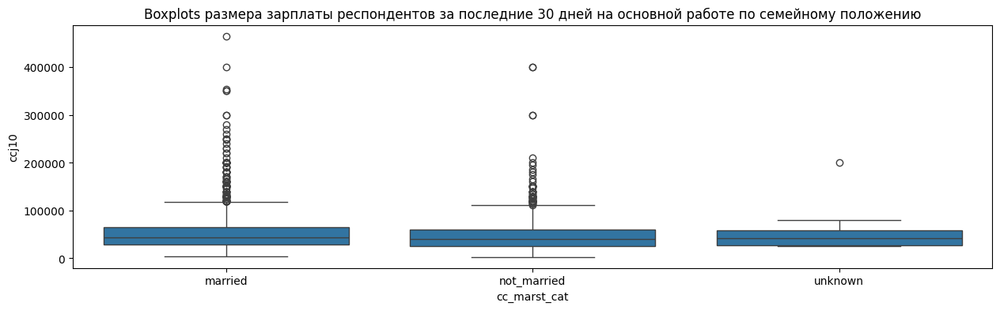

In [37]:
# Построим ящичковые диаграммы распределения зп по семейному положению
plt.figure(figsize=(15, 4))
sns.boxplot(x='cc_marst_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по семейному положению')
plt.xlabel('cc_marst_cat')
plt.ylabel('ccj10')
plt.show();

Медианная зарплата в группе состаящих в браке немного выше, чем у остальных.

In [38]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по семейному положению
df.pivot_table(index=['cc_marst_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
cc_marst_cat,,
married,2686,0.31
not_married,2116,0.37
unknown,14,0.36


##### **ccj72_171 (есть ли дети)**

In [39]:
# Категоризуем переменную ccj72_171
df['ccj72_171_cat'] = df['ccj72_171'].map(ccj72_171_d)
# Заполним пропуски 'no'
df.loc[df['ccj72_171'].isnull()==True, 'ccj72_171_cat'] = 'no'
# Удалим переменную ccj72_171
del df['ccj72_171']
# Выведим содержимое столбца ccj72_171_cat
print(df['ccj72_171_cat'].value_counts())

ccj72_171_cat
yes        3605
no         1208
unknown       3
Name: count, dtype: int64


In [40]:
# Проверка
df[df['ccj72_171_cat'].isnull()==True].shape[0]

0

Категоризовали переменную "Наличие детей". Переменная содержит 3 пропуска (категория "unknown"). В дальнейшем перед моделированием переменной применим OneHotEncoder для получения дамми.

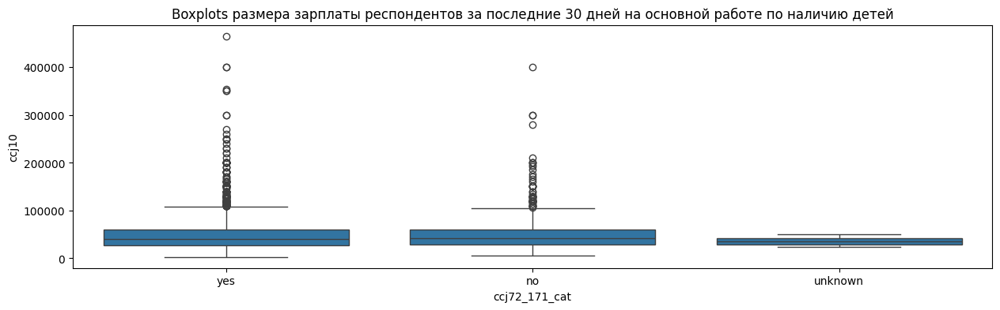

In [41]:
# Построим ящичковые диаграммы распределения зп по наличию детей
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj72_171_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по наличию детей')
plt.xlabel('ccj72_171_cat')
plt.ylabel('ccj10')
plt.show();

In [42]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по наличию детей
df.pivot_table(index=['ccj72_171_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj72_171_cat,,
no,1208,0.33
unknown,3,0.33
yes,3605,0.34


##### **ccj72_172 (количество детей)**

In [43]:
# Заполним частично пропуски нулем
df.loc[df['ccj72_171_cat'] == 'no', 'ccj72_172'] = 0
# Заполним оставшиеся пропуски
df.loc[df['ccj72_172'].isnull()==True, 'ccj72_172'] = 'unknown'
df.loc[df['ccj72_172'] == 99999997, 'ccj72_172'] = 'unknown'
df.loc[df['ccj72_172'] == 99999998, 'ccj72_172'] = 'unknown'
df.loc[df['ccj72_172'] == 99999999, 'ccj72_172'] = 'unknown'
# Выведим содержимое столбца ccj72_172
print(df['ccj72_172'].value_counts())

ccj72_172
2.00        1571
1.00        1552
0.00        1208
3.00         372
4.00          81
5.00          12
6.00           9
 unknown       4
7.00           4
11.00          1
10.00          1
9.00           1
Name: count, dtype: int64


In [44]:
# Проверка
df[df['ccj72_172'].isnull()==True].shape[0]

0

Обработали переменную 'Количество детей'. Переменная содержит 4 пропуска (категория "unknown").

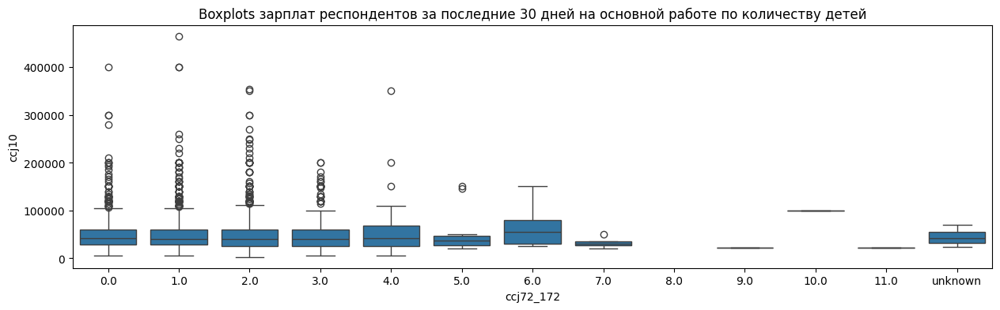

In [45]:
# Построим ящичковые диаграммы распределения зп по количеству детей
plt.figure(figsize=(15, 4))
order = ['0.0','1.0','2.0','3.0','4.0','5.0','6.0','7.0','8.0','9.0','10.0', '11.0', 'unknown']
sns.boxplot(x='ccj72_172', y='ccj10', data=df, orientation='vertical', order = order)
plt.title('Boxplots зарплат респондентов за последние 30 дней на основной работе по количеству детей')
plt.xlabel('ccj72_172')
plt.ylabel('ccj10')
plt.show();

In [46]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по количеству детей
df.pivot_table(index=['ccj72_172'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj72_172,,
0.00,1208,0.33
1.00,1552,0.32
2.00,1571,0.35
3.00,372,0.39
4.00,81,0.36
5.00,12,0.42
6.00,9,0.33
7.00,4,0.50
9.00,1,1.00


Доля людей с зп менее 30 тыс. руб. с ростом количества детей растет.

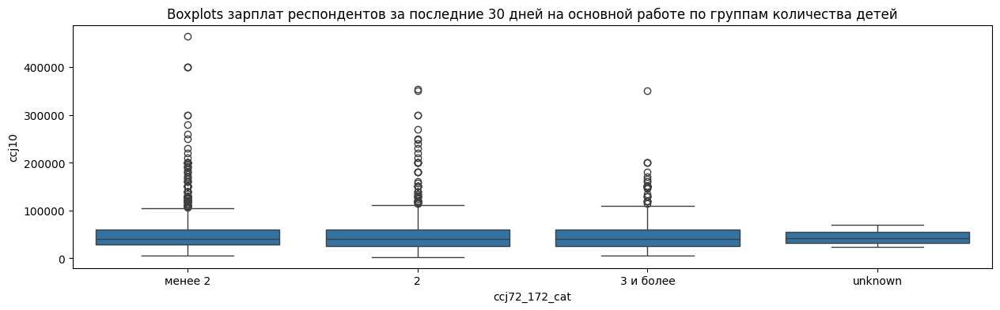

In [47]:
# Категаризуем переменную ccj72_172
def categorize_cc_child(row):
    """Функция категоризации ccj72_172"""
    try:
      if row['ccj72_172']<2:
          return 'менее 2'
      elif row['ccj72_172']==2:
          return '2'
      elif row['ccj72_172']>2:
          return '3 и более'
    except:
      return 'unknown'

# Создадим категоризованный столбец ccj72_172_cat
df['ccj72_172_cat']  = df.apply(categorize_cc_child, axis=1)

order = ['менее 2', '2', '3 и более', 'unknown']
# Построим ящичковые диаграммы распределения зп респондентов по количеству детей
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj72_172_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots зарплат респондентов за последние 30 дней на основной работе по группам количества детей')
plt.xlabel('ccj72_172_cat')
plt.ylabel('ccj10')
plt.show();

In [48]:
# Удалим столбец
del df['ccj72_172']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по количеству детей
df.pivot_table(index=['ccj72_172_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj72_172_cat,,
2,1571,0.35
3 и более,481,0.38
unknown,4,0.25
менее 2,2760,0.32


##### **ccj72_173 (количество детей моложе 18)**

In [49]:
# Заполним частично пропуски нулем
df.loc[df['ccj72_171_cat'] == 'no', 'ccj72_173'] = 0
# Заполним оставшиеся пропуски
df.loc[df['ccj72_173'].isnull()==True, 'ccj72_173'] = 'unknown'
df.loc[df['ccj72_173'] == 99999997, 'ccj72_173'] = 'unknown'
df.loc[df['ccj72_173'] == 99999998, 'ccj72_173'] = 'unknown'
df.loc[df['ccj72_173'] == 99999999, 'ccj72_173'] = 'unknown'
# Выведим содержимое столбца ccj72_173
print(df['ccj72_173'].value_counts())

ccj72_173
0.00        2873
1.00        1188
2.00         564
3.00         146
4.00          26
 unknown       7
5.00           5
6.00           5
8.00           1
10.00          1
Name: count, dtype: int64


In [50]:
# Проверка
df[df['ccj72_173'].isnull()==True].shape[0]

0

Обработали переменную 'Количество детей'. Переменная содержит 7 пропусков (категория "unknown").

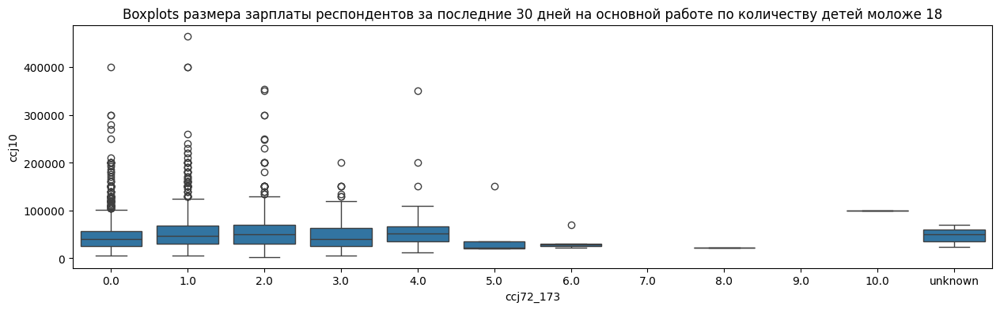

In [51]:
# Построим ящичковые диаграммы распределения зп по количеству детей моложе 18
plt.figure(figsize=(15, 4))
order = ['0.0','1.0','2.0','3.0','4.0','5.0','6.0','7.0','8.0','9.0','10.0','unknown']
sns.boxplot(x='ccj72_173', y='ccj10', data=df, orientation='vertical', order = order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по количеству детей моложе 18')
plt.xlabel('ccj72_173')
plt.ylabel('ccj10')
plt.show();

In [52]:
# Подсчитаем долю людей с зп менее 30 тыс. руб. в группах по количеству детей моложе 18
df.groupby('ccj72_173')['ccj10_cat'].mean().sort_values(ascending = False)

,ccj10_cat
ccj72_173,
8.00,1.00
6.00,0.80
5.00,0.60
0.00,0.38
3.00,0.38
1.00,0.26
2.00,0.26
4.00,0.23
unknown,0.14


Доля людей с зп менее 30 тыс. руб. с ростом количества детей моложе 18 имеет тенденцию к росту.

In [53]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по количеству детей моложе 18
df.pivot_table(index=['ccj72_173'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj72_173,,
0.00,2873,0.38
1.00,1188,0.26
2.00,564,0.26
3.00,146,0.38
4.00,26,0.23
5.00,5,0.60
6.00,5,0.80
8.00,1,1.00
10.00,1,0.00


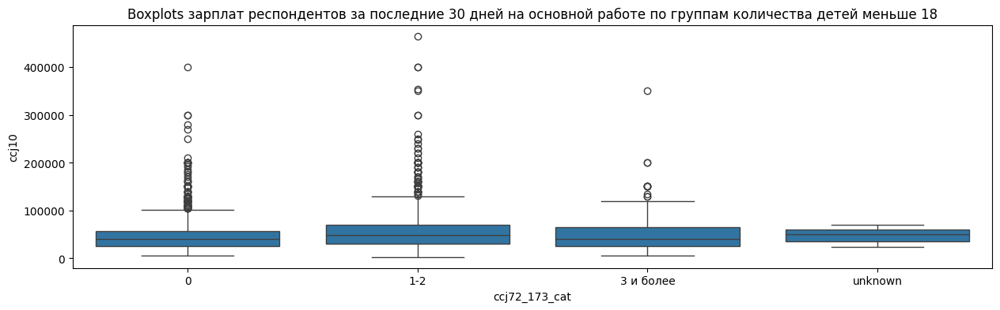

In [54]:
# Категаризуем переменную ccj72_173
def categorize_cc_child18(row):
    """Функция категоризации ccj72_173"""
    try:
      if row['ccj72_173']==0:
          return '0'
      elif row['ccj72_173']<=2:
          return '1-2'
      elif row['ccj72_173']>2:
          return '3 и более'
    except:
      return 'unknown'

# Создадим категоризованный столбец ccj72_172_cat
df['ccj72_173_cat']  = df.apply(categorize_cc_child18, axis=1)

order = ['0', '1-2', '3 и более', 'unknown']
# Построим ящичковые диаграммы распределения зп респондентов по количеству детей
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj72_173_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots зарплат респондентов за последние 30 дней на основной работе по группам количества детей меньше 18')
plt.xlabel('ccj72_173_cat')
plt.ylabel('ccj10')
plt.show();

In [55]:
# Удалим столбец
del df['ccj72_173']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по количеству детей младше 18
df.pivot_table(index=['ccj72_173_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj72_173_cat,,
0,2873,0.38
1-2,1752,0.26
3 и более,184,0.38
unknown,7,0.14


##### **cc_diplom (образование (группа))**  

In [56]:
# Заполним пропуски 'unknown'
df.loc[df['cc_diplom'].isnull()==True, 'cc_diplom'] = 'unknown'
df.loc[df['cc_diplom'] == 99999997, 'cc_diplom'] = 'unknown'
df.loc[df['cc_diplom'] == 99999998, 'cc_diplom'] = 'unknown'
df.loc[df['cc_diplom'] == 99999999, 'cc_diplom'] = 'unknown'
# Выведим содержимое столбца cc_diplom
print(df['cc_diplom'].value_counts())

cc_diplom
6.00        1665
5.00        1367
4.00        1351
3.00         337
2.00          72
 unknown      17
1.00           7
Name: count, dtype: int64


In [57]:
# Проверка
df[df['cc_diplom'].isnull()==True].shape[0]

0

In [58]:
# Категоризуем переменную cc_diplom на категории есть/нет высшее образование
df['cc_diplom_cat'] = df['cc_diplom'].map(cc_diplom_d_f)
# Заполним пропуски 'unknown'
df.loc[df['cc_diplom'] == 'unknown', 'cc_diplom_cat'] = 'unknown'
# Выведим содержимое столбца cc_diplom_cat
print(df['cc_diplom_cat'].value_counts())

cc_diplom_cat
no         3134
yes        1665
unknown      17
Name: count, dtype: int64


In [59]:
# Проверка
df[df['cc_diplom_cat'].isnull()==True].shape[0]

0

Предобработали переменную 'Образование (группа)'. Оставили переменную "cc_diplom_cat". Переменная содержит 17 пропусков (категория "unknown"). В дальнейшем перед моделированием для cc_diplom_cat применим OneHotEncoder для получения дамми.  



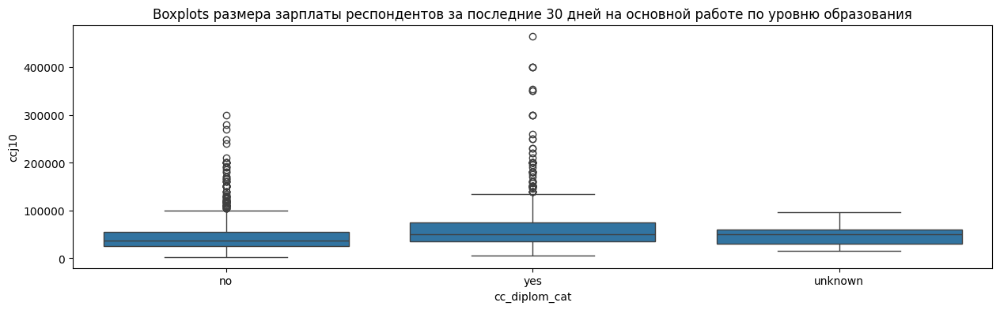

In [60]:
# Построим ящичковые диаграммы распределения зп по уровню образования
plt.figure(figsize=(15, 4))
sns.boxplot(x='cc_diplom_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по уровню образования')
plt.xlabel('cc_diplom_cat')
plt.ylabel('ccj10')
plt.show();

In [61]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по наличию высшего образования
df.pivot_table(index=['cc_diplom_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
cc_diplom_cat,,
no,3134,0.40
unknown,17,0.35
yes,1665,0.22


Доля людей с зп менее 30 тыс. руб. в группе без высшего образования - 0.40, с высшим - 0.22.

In [62]:
# Категоризуем переменную cc_diplom по количеству лет образования
df['diplom_years'] = df['cc_diplom'].map(diplom_years_map)
# Удалим переменную cc_diplom
del df['cc_diplom']
# Заполним пропуски 'unknown'
df.loc[df['diplom_years'].isnull()==True, 'diplom_years'] = 'unknown'
# Выведим содержимое столбца diplom_years
print(df['diplom_years'].value_counts())

diplom_years
16         1665
13         1367
11         1351
9           337
8            72
unknown      17
6             7
Name: count, dtype: int64


In [63]:
# Проверка
df[df['diplom_years'].isnull()==True].shape[0]

0

Предобработали переменную 'Количество лет образования'. Оставили переменную "diplom_years". Переменная содержит 17 пропусков (категория "unknown").

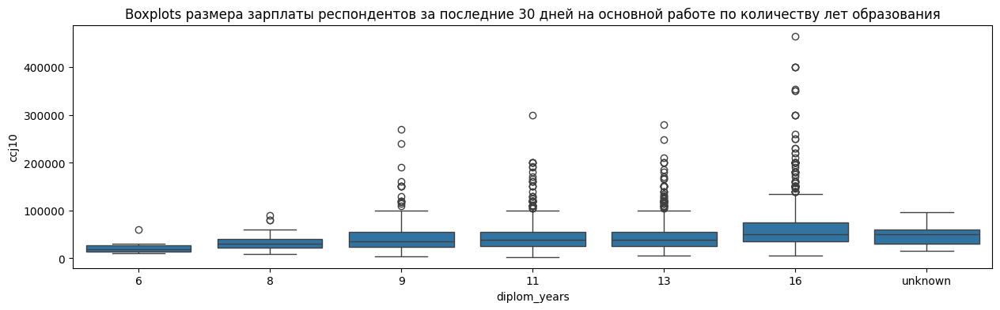

In [64]:
# Построим ящичковые диаграммы распределения зп по количеству лет образования
plt.figure(figsize=(15, 4))
order = ['6','8','9', '11','13', '16', 'unknown']
sns.boxplot(x='diplom_years', y='ccj10', data=df, orientation='vertical', order = order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по количеству лет образования')
plt.xlabel('diplom_years')
plt.ylabel('ccj10')
plt.show();

In [65]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по количеству лет образования
df.pivot_table(index=['diplom_years'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
diplom_years,,
6,7,0.86
8,72,0.57
9,337,0.44
11,1351,0.39
13,1367,0.38
16,1665,0.22
unknown,17,0.35


Чем больше лет образования, тем меньше доля людей с зп менее 30 тыс. руб.

##### **ccj260 (владение иностранным языком)**

In [66]:
# Категоризуем переменную ccj260
df['ccj260_cat'] = df['ccj260'].map(ccj260_d)
# Заполним пропуски 'unknown'
df.loc[df['ccj260'].isnull()==True, 'ccj260_cat'] = 'no'
# Удалим переменную ccj260
del df['ccj260']
# Выведим содержимое столбца ccj260_cat
print(df['ccj260_cat'].value_counts())

ccj260_cat
no         3854
yes         924
unknown      38
Name: count, dtype: int64


In [67]:
# Проверка
df[df['ccj260_cat'].isnull()==True].shape[0]

0

Категоризовали переменную "Владение иностранным языком". Переменная содержит 38 пропусков (категория "unknown"). В дальнейшем перед моделированием переменной применим OneHotEncoder для получения дамми.

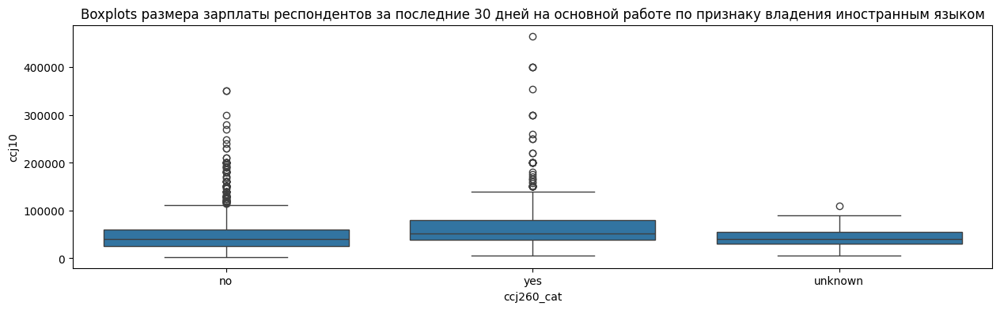

In [68]:
# Построим ящичковые диаграммы распределения зп по владению иностранным языком
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj260_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по признаку владения иностранным языком')
plt.xlabel('ccj260_cat')
plt.ylabel('ccj10')
plt.show();

In [69]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по владению иностранным языком
df.pivot_table(index=['ccj260_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj260_cat,,
no,3854,0.38
unknown,38,0.29
yes,924,0.18


Доля людей с зп менее 30 тыс. руб. в группе не владеющих иностранным языком - 0.38, владеющих - 0.18.

##### **ccj262 (степень владение иностранным языком)**

In [70]:
# Заполним пропуски 'unknown'
df.loc[df['ccj260_cat'] == 'no', 'ccj262'] = 4
df.loc[df['ccj262'].isnull()==True, 'ccj262'] = 'unknown'
df.loc[df['ccj262'] == 99999997, 'ccj262'] = 'unknown'
df.loc[df['ccj262'] == 99999998, 'ccj262'] = 'unknown'
df.loc[df['ccj262'] == 99999999, 'ccj262'] = 'unknown'
print(df['ccj262'].value_counts())

ccj262
4.00        3854
3.00         636
2.00         227
1.00          59
 unknown      40
Name: count, dtype: int64


In [71]:
# Проверка
df[df['ccj262'].isnull()==True].shape[0]

0

Предобработали переменную "Степень владение иностранным языком". Переменная порядковая. Переменная содержит 40 пропусков (категория "unknown").

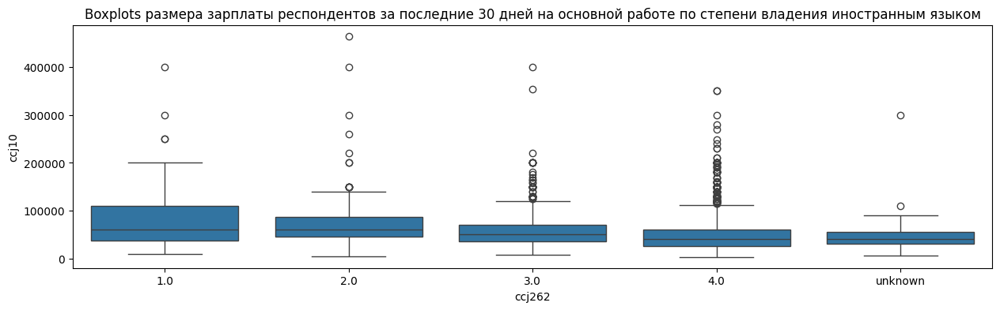

In [72]:
# Построим ящичковые диаграммы распределения зп по владению иностранным языком
plt.figure(figsize=(15, 4))
order = ['1.0','2.0','3.0','4.0', 'unknown']
sns.boxplot(x='ccj262', y='ccj10', data=df, orientation='vertical', order = order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по степени владения иностранным языком')
plt.xlabel('ccj262')
plt.ylabel('ccj10')
plt.show();

In [73]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по степени владения иностранным языком (1 - свободное владение,
# 2 - Можете изъясняться и достаточно свободно читаете ...)
df.pivot_table(index=['ccj262'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj262,,
1.00,59,0.17
2.00,227,0.13
3.00,636,0.20
4.00,3854,0.38
unknown,40,0.30


Чем выше уровень владения иностранным языком, тем доля людей с зп менее 30 тыс. руб. меньше.

##### **ccj161_3y (стаж, лет) и ccj161_3m (стаж месяцев)**

In [74]:
# Заполним пропуски 'unknown' для 'cj161_3y'
df.loc[df['ccj161_3y'].isnull()==True, 'ccj161_3y'] = 'unknown'
df.loc[df['ccj161_3y'] == 99999996, 'ccj161_3y'] = 0
df.loc[df['ccj161_3y'] == 99999997, 'ccj161_3y'] = 'unknown'
df.loc[df['ccj161_3y'] == 99999998, 'ccj161_3y'] = 'unknown'
df.loc[df['ccj161_3y'] == 99999999, 'ccj161_3y'] = 'unknown'

In [75]:
# Проверка
df[df['ccj161_3y'].isnull()==True].shape[0]

0

In [76]:
# Проверка
df[df['ccj161_3y']=='unknown'].shape[0]

283

In [77]:
# Заполним пропуски 'unknown' для 'ccj161_3m'
df.loc[df['ccj161_3m'].isnull()==True, 'ccj161_3m'] = 'unknown'
df.loc[df['ccj161_3m'] == 99999997, 'ccj161_3m'] = 'unknown'
df.loc[df['ccj161_3m'] == 99999998, 'ccj161_3m'] = 'unknown'
df.loc[df['ccj161_3m'] == 99999999, 'ccj161_3m'] = 'unknown'

In [78]:
# Проверка
df[df['ccj161_3m'].isnull()==True].shape[0]

0

In [79]:
# Проверка
df[df['ccj161_3m']=='unknown'].shape[0]

381

In [80]:
# Вычислим стаж всего в годах
def calc_exp(row):
    """Функция вычисляет стаж всего в годах"""
    if row['ccj161_3m'] == 'unknown':
        return row['ccj161_3y']
    else:
        return int(row['ccj161_3m'])/12 + int(row['ccj161_3y'])
# Создадим категоризованный столбец cc_age_cat
df['exp']  = df.apply(calc_exp, axis=1)

In [81]:
# Проверка
df[df['exp'].isnull()==True].shape[0]

0

In [82]:
# Проверка
df[df['exp']=='unknown'].shape[0]

283

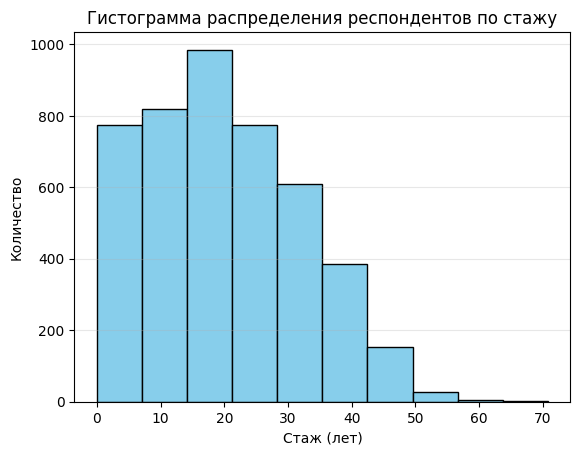

In [83]:
# Удалим столбцы
del df['ccj161_3y']
del df['ccj161_3m']
# Построим гистограмму для exp
plt.hist(df[df['exp']!='unknown']['exp'], bins=10, edgecolor='black', color='skyblue') # Гистограмма с 10 столбцами
plt.title('Гистограмма распределения респондентов по стажу')
plt.xlabel('Стаж (лет)')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show()

Предобработали переменную "Стаж". Переменная содержит 283 пропуска (категория "unknown").

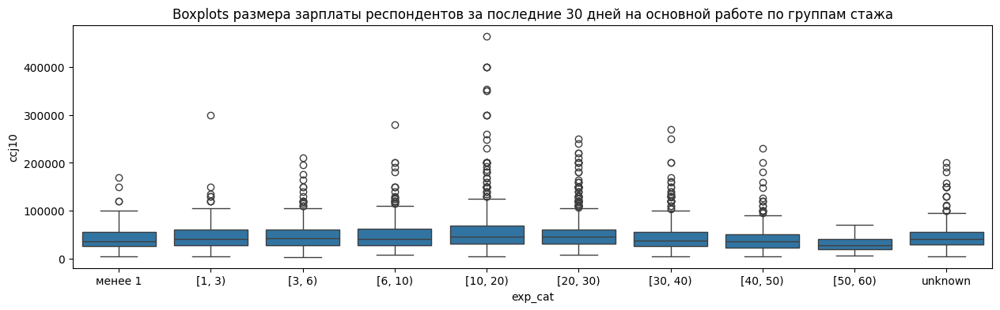

In [84]:
# Категаризуем переменную exp
def categorize_exp(row):
    """Функция категоризации exp"""
    try:
        if row['exp']<1:
            return 'менее 1'
        elif row['exp']<3:
            return '[1, 3)'
        elif row['exp']<6:
            return '[3, 6)'
        elif row['exp']<10:
            return '[6, 10)'
        elif row['exp']<20:
            return '[10, 20)'
        elif row['exp']<30:
            return '[20, 30)'
        elif row['exp']<40:
            return '[30, 40)'
        elif row['exp']<50:
            return '[40, 50)'
        elif row['exp']<60:
            return '[50, 60)'
        elif row['exp']>=60:
             return '60 и более'
    except:
        return 'unknown'

# Создадим категоризованный столбец exp_cat
df['exp_cat']  = df.apply(categorize_exp, axis=1)
order = ['менее 1', '[1, 3)', '[3, 6)', '[6, 10)', '[10, 20)', '[20, 30)', '[30, 40)',\
         '[40, 50)', '[50, 60)', 'unknown']
# Построим ящичковые диаграммы распределения зп по уровню образования
plt.figure(figsize=(15, 4))
sns.boxplot(x='exp_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по группам стажа')
plt.xlabel('exp_cat')
plt.ylabel('ccj10')
plt.show();

In [85]:
# Удалим столбцы
del df['exp']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. по группам стажа
df.pivot_table(index=['exp_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
exp_cat,,
60 и более,3,0.67
"[1, 3)",169,0.36
"[10, 20)",1323,0.28
"[20, 30)",1122,0.30
"[3, 6)",297,0.31
"[30, 40)",757,0.40
"[40, 50)",290,0.46
"[50, 60)",28,0.61
"[6, 10)",377,0.34


Взаимосвязь зарплаты и стажа не похожа на линейную, а скорее имеет u-образную форму. Сначала с ростом стажа зп в среднем растет, а затем начинает снижаться. В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **ccj5a - (стаж на текущем месте работы (лет)) и ccj5b (стаж на текущем месте работы (мес))**

In [86]:
# Заполним пропуски 'unknown' для 'ccj5a'
df.loc[df['ccj5a'].isnull()==True, 'ccj5a'] = 'unknown'
df.loc[df['ccj5a'] == 99999997, 'ccj5a'] = 'unknown'
df.loc[df['ccj5a'] == 99999998, 'ccj5a'] = 'unknown'
df.loc[df['ccj5a'] == 99999999, 'ccj5a'] = 'unknown'

In [87]:
# Проверка
df[df['ccj5a'].isnull()==True].shape[0]

0

In [88]:
# Проверка
df[df['ccj5a']=='unknown'].shape[0]

31

In [89]:
# Заполним пропуски 'unknown' для 'ccj5b'
df.loc[df['ccj5b'].isnull()==True, 'ccj5b'] = 'unknown'
df.loc[df['ccj5b'] == 99999997, 'ccj5b'] = 'unknown'
df.loc[df['ccj5b'] == 99999998, 'ccj5b'] = 'unknown'
df.loc[df['ccj5b'] == 99999999, 'ccj5b'] = 'unknown'

In [90]:
# Проверка
df[df['ccj5b'].isnull()==True].shape[0]

0

In [91]:
# Проверка
df[df['ccj5b']=='unknown'].shape[0]

203

In [92]:
# Вычислим стаж на текущем месте работы в годах
def calc_exp_cur(row):
    """Функция вычисляет стаж всего в годах на текущем месте работы"""
    if (row['ccj5b'] == 'unknown') and (row['ccj5a'] == 'unknown'):
        return 'unknown'
    elif (row['ccj5b'] != 'unknown') and (row['ccj5a'] == 'unknown'):
        return row['ccj5b']/12
    elif (row['ccj5b'] == 'unknown') and (row['ccj5a'] != 'unknown'):
        return int(row['cc_int_y']) - int(row['ccj5a'])
    else:
        return int(row['ccj5b'])/12 + (int(row['cc_int_y']) - int(row['ccj5a']))
# Создадим категоризованный столбец
df['exp_curr']  = df.apply(calc_exp_cur, axis=1)

In [93]:
# Проверка
df[df['exp_curr'].isnull()==True].shape[0]

0

In [94]:
# Проверка
df[df['exp_curr']=='unknown'].shape[0]

27

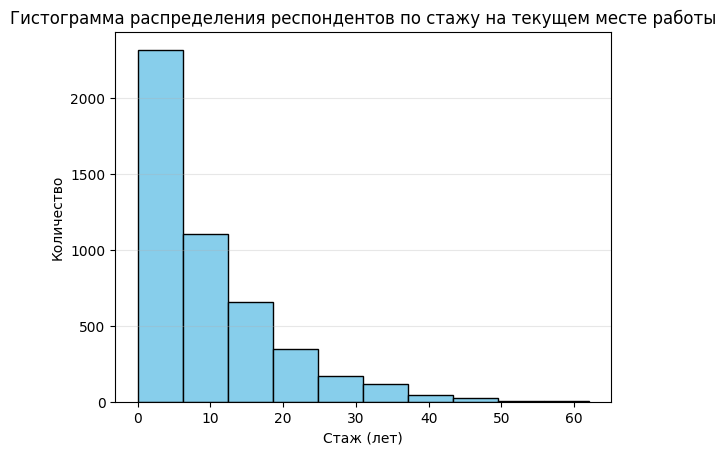

In [95]:
# Удалим столбцы
del df['ccj5a']
del df['ccj5b']
del df['cc_int_y']
# Построим гистограмму для exp_curr
plt.hist(df[df['exp_curr']!='unknown']['exp_curr'], bins=10, edgecolor='black', color='skyblue')
plt.title('Гистограмма распределения респондентов по стажу на текущем месте работы')
plt.xlabel('Стаж (лет)')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show()

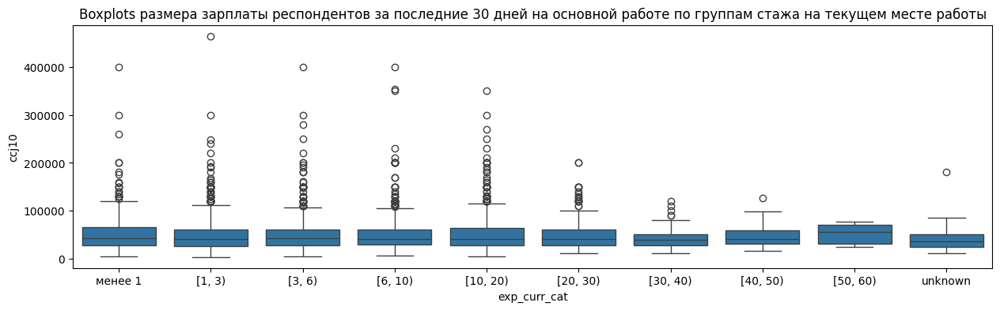

In [96]:
# Категаризуем переменную exp_curr
def categorize_exp_curr(row):
    """Функция категоризации exp_curr"""
    try:
        if row['exp_curr']<1:
            return 'менее 1'
        elif row['exp_curr']<3:
            return '[1, 3)'
        elif row['exp_curr']<6:
            return '[3, 6)'
        elif row['exp_curr']<10:
            return '[6, 10)'
        elif row['exp_curr']<20:
            return '[10, 20)'
        elif row['exp_curr']<30:
            return '[20, 30)'
        elif row['exp_curr']<40:
            return '[30, 40)'
        elif row['exp_curr']<50:
            return '[40, 50)'
        elif row['exp_curr']<60:
            return '[50, 60)'
        elif row['exp_curr']>=60:
             return '60 и более'
    except:
        return 'unknown'

# Создадим категоризованный столбец exp_cat
df['exp_curr_cat']  = df.apply(categorize_exp_curr, axis=1)
order = ['менее 1', '[1, 3)', '[3, 6)', '[6, 10)', '[10, 20)', '[20, 30)', '[30, 40)', '[40, 50)', '[50, 60)', 'unknown']
# Построим ящичковые диаграммы распределения зп по стажу
plt.figure(figsize=(15, 4))
sns.boxplot(x='exp_curr_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по группам стажа на текущем месте работы')
plt.xlabel('exp_curr_cat')
plt.ylabel('ccj10')
plt.show();

In [97]:
# Удалим столбцы
del df['exp_curr']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. по группам стажа на текущем месте работы
df.pivot_table(index=['exp_curr_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
exp_curr_cat,,
60 и более,1,0.00
"[1, 3)",860,0.37
"[10, 20)",1093,0.32
"[20, 30)",403,0.34
"[3, 6)",923,0.34
"[30, 40)",172,0.37
"[40, 50)",42,0.29
"[50, 60)",6,0.33
"[6, 10)",817,0.31


Взаимосвязь зарплаты и стажа не похожа на линейную. В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **ccj6_2 (продолжительность рабочей недели в часах)**

In [98]:
# Заполним пропуски 'unknown'
df.loc[df['ccj6_2'].isnull()==True, 'ccj6_2'] = 'unknown'
df.loc[df['ccj6_2'] == 99999996, 'ccj6_2'] = 'unknown'
df.loc[df['ccj6_2'] == 99999997, 'ccj6_2'] = 'unknown'
df.loc[df['ccj6_2'] == 99999998, 'ccj6_2'] = 'unknown'
df.loc[df['ccj6_2'] == 99999999, 'ccj6_2'] = 'unknown'

In [99]:
# Проверка
df[df['ccj6_2'].isnull()==True].shape[0]

0

In [100]:
# Проверка
df[df['ccj6_2']=='unknown'].shape[0]

518

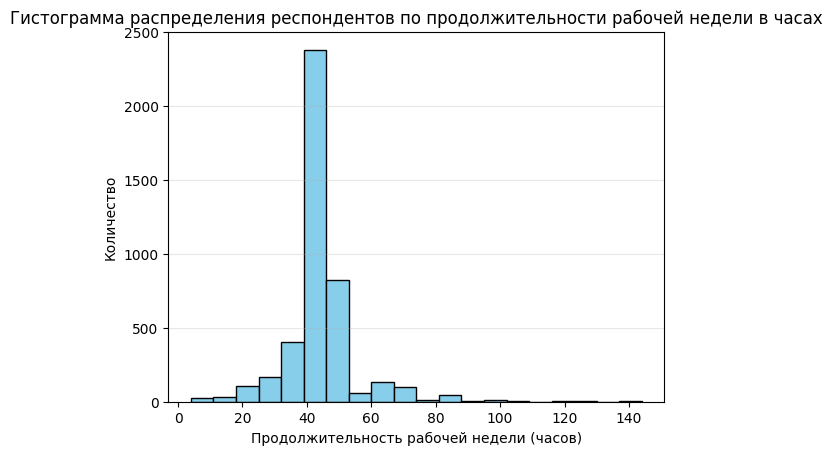

In [101]:
# Построим гистограмму для ccj6_2
plt.hist(df[df['ccj6_2']!='unknown']['ccj6_2'], bins=20, edgecolor='black', color='skyblue')
plt.title('Гистограмма распределения респондентов по продолжительности рабочей недели в часах')
plt.xlabel('Продолжительность рабочей недели (часов)')
plt.ylabel('Количество')
plt.grid(axis='y', alpha=0.3)
plt.show()

Предобработали переменную "Продолжительность рабочей недели". Переменная содержит 518 пропусков (категория "unknown").

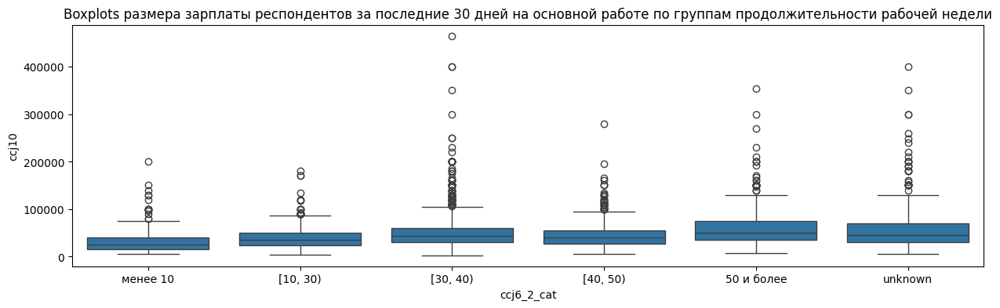

In [102]:
# Категаризуем переменную ccj6_2
def categorize_work_time(row):
    """Функция категоризации ccj6_2"""
    try:
        if row['ccj6_2']<30:
            return 'менее 10'
        elif row['ccj6_2']<40:
            return '[10, 30)'
        elif row['ccj6_2']<45:
            return '[30, 40)'
        elif row['ccj6_2']<50:
            return '[40, 50)'
        elif row['ccj6_2']>=50:
             return '50 и более'
    except:
        return 'unknown'

# Создадим категоризованный столбец ccj6_2_cat
df['ccj6_2_cat']  = df.apply(categorize_work_time, axis=1)
order = ['менее 10', '[10, 30)', '[30, 40)', '[40, 50)', '50 и более', 'unknown']
# Построим ящичковые диаграммы распределения зп по продолжительности рабочей недели
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj6_2_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по группам продолжительности рабочей недели')
plt.xlabel('ccj6_2_cat')
plt.ylabel('ccj10')
plt.show();

In [103]:
# Удалим столбцы
del df['ccj6_2']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. по группам продолжительности рабочей недели
df.pivot_table(index=['ccj6_2_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj6_2_cat,,
50 и более,541,0.22
"[10, 30)",550,0.46
"[30, 40)",2241,0.31
"[40, 50)",763,0.36
unknown,518,0.30
менее 10,203,0.65


Взаимосвязь зарплаты и продолжительности рабочей недели не похожа на линейную. В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **region (регион) & status (тип населенного пункта)**

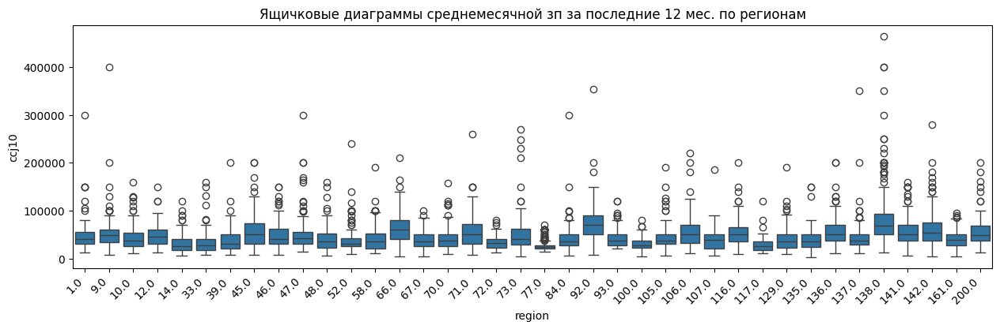

In [104]:
# Построим ящичковые диаграммы распределения зп по регионам
plt.figure(figsize=(15, 4))
sns.boxplot(x='region', y='ccj10', data=df, orientation='vertical')
plt.title('Ящичковые диаграммы среднемесячной зп за последние 12 мес. по регионам')
plt.xlabel('region')
plt.xticks(rotation=45, ha='right')
plt.ylabel('ccj10')
plt.show();

Видим, что медианый доход очень высокий в регионах 66 (Красноярск), 92 (Владивосток), 138 (Москва).

In [105]:
# Категоризуем переменную status
df['status_cat'] = df['status'].map(status_d)
# Удалим переменную status
del df['status']
# Выведим содержимое столбца status
print(df['status_cat'].value_counts())

status_cat
center_area      2120
city             1302
village           982
urban_village     412
Name: count, dtype: int64


In [106]:
# Проверка
df[df['status_cat'].isnull()==True].shape[0]

0

In [107]:
# Посмотрим, какие регионы попали в center_area
df[df['status_cat']=='center_area']['region'].unique()

array([  9.,  45.,  46.,  66.,  70.,  71.,  72.,  92., 105., 106., 116.,
       135., 136., 138., 141.])

Видим, что 66 (Красноярск), 92 (Владивосток), 138 (Москва) входят в 'center_area'. В категории 'center_area' выделим подгатегорию (Красноярск, Владивосток, Москва).

In [108]:
# Категоризуем переменную status
df['status_cat'] = np.where(df['region'].isin([66, 92, 138]), 'center_area_high', df['status_cat'])
# Удалим переменную "region"
del df['region']
# Выведим содержимое столбца status
print(df['status_cat'].value_counts())

status_cat
center_area         1494
city                1297
village              975
center_area_high     638
urban_village        412
Name: count, dtype: int64


Категоризовали переменную "Тип населенного пункта". Переменная не содержит пропусков. В дальнейшем перед моделированием применим OneHotEncoder для получения дамми.

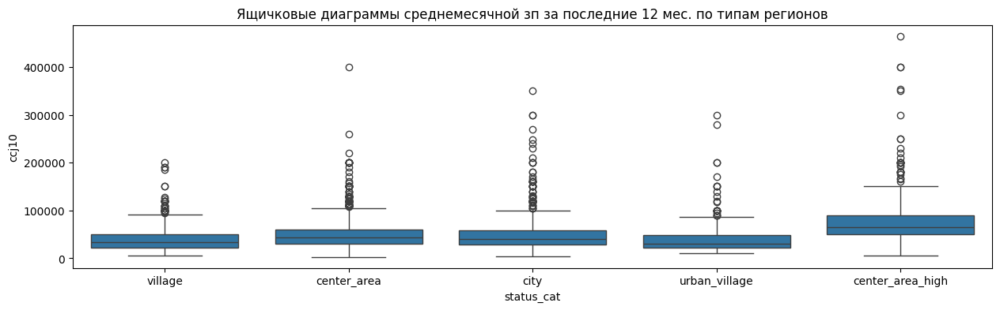

In [109]:
# Построим ящичковые диаграммы распределения зп по типам регионов
plt.figure(figsize=(15, 4))
sns.boxplot(x='status_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Ящичковые диаграммы среднемесячной зп за последние 12 мес. по типам регионов')
plt.xlabel('status_cat')
plt.ylabel('ccj10')
plt.show();

In [110]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах по группам status_cat
df.pivot_table(index=['status_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
status_cat,,
center_area,1494,0.28
center_area_high,638,0.09
city,1297,0.34
urban_village,412,0.57
village,975,0.48


Видим, что группы различаются по доле людей, с зп менее 30 тыс. руб.

##### **cc_occup08 (профессиональная группа)**

In [111]:
# Заполним пропуски 'unknown'
df.loc[df['cc_occup08'].isnull()==True, 'cc_occup08'] = 'unknown'
df.loc[df['cc_occup08'] == 99999997, 'cc_occup08'] = 'unknown'
df.loc[df['cc_occup08'] == 99999998, 'cc_occup08'] = 'unknown'
df.loc[df['cc_occup08'] == 99999999, 'cc_occup08'] = 'unknown'
# Выведим содержимое столбца cc_occup08
print(df['cc_occup08'].value_counts())

cc_occup08
3.00        941
5.00        889
2.00        848
7.00        618
8.00        581
9.00        371
4.00        270
1.00        254
0.00         24
 unknown     13
6.00          7
Name: count, dtype: int64


In [112]:
# Проверка
df[df['cc_occup08'].isnull()==True].shape[0]

0

Переменная содержит пропуски.

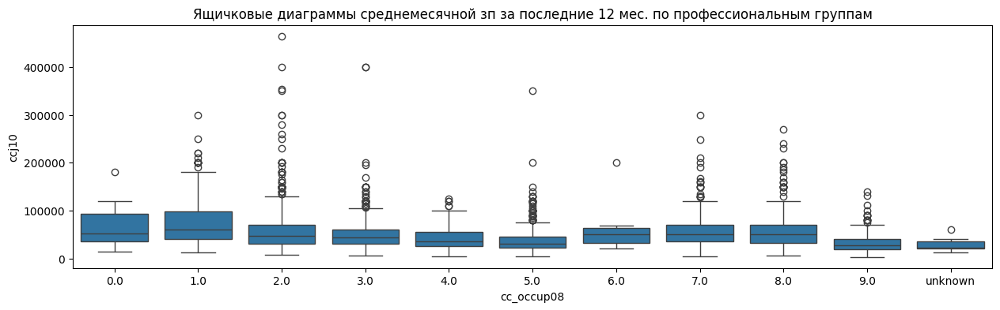

In [113]:
# Зададим порядок
order = ['0.0','1.0','2.0','3.0','4.0','5.0','6.0','7.0','8.0','9.0','unknown']
# Построим ящичковые диаграммы распределения зп по профессиональным группам
plt.figure(figsize=(15, 4))
sns.boxplot(x='cc_occup08', y='ccj10', data=df, orientation='vertical', order = order)
plt.title('Ящичковые диаграммы среднемесячной зп за последние 12 мес. по профессиональным группам')
plt.xlabel('cc_occup08')
plt.ylabel('ccj10')
plt.show();

In [114]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах cc_occup08
df.pivot_table(index=['cc_occup08'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
cc_occup08,,
0.00,24,0.21
1.00,254,0.17
2.00,848,0.26
3.00,941,0.31
4.00,270,0.39
5.00,889,0.50
6.00,7,0.29
7.00,618,0.22
8.00,581,0.25


Взаимосвязь зарплаты и проф группы не похожа на линейную. В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **ccj4_1 (отрасль)**

In [115]:
# Заполним пропуски 'unknown'
df.loc[df['ccj4_1'].isnull()==True, 'ccj4_1'] = 'unknown'
df.loc[df['ccj4_1'] == 99999997, 'ccj4_1'] = 'unknown'
df.loc[df['ccj4_1'] == 99999998, 'ccj4_1'] = 'unknown'
df.loc[df['ccj4_1'] == 99999999, 'ccj4_1'] = 'unknown'
# Выведим содержимое столбца ccj4_1
print(df['ccj4_1'].value_counts())

ccj4_1
14.00       1065
10.00        479
7.00         439
12.00        433
6.00         308
1.00         273
13.00        213
17.00        201
5.00         190
8.00         170
3.00         145
11.00        120
9.00         120
2.00          97
16.00         90
15.00         89
27.00         77
4.00          77
20.00         36
 unknown      29
24.00         27
23.00         24
25.00         24
26.00         20
18.00         19
21.00         17
30.00         16
29.00          7
28.00          6
31.00          4
22.00          1
Name: count, dtype: int64


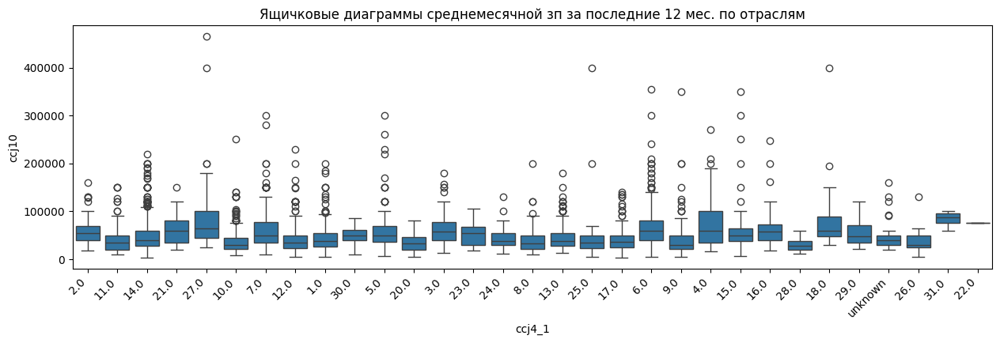

In [116]:
# Построим ящичковые диаграммы распределения зп по отраслям
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj4_1', y='ccj10', data=df, orientation='vertical')
plt.title('Ящичковые диаграммы среднемесячной зп за последние 12 мес. по отраслям')
plt.xlabel('ccj4_1')
plt.xticks(rotation=45, ha='right')
plt.ylabel('ccj10')
plt.show();

In [117]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах ccj4_1
df.pivot_table(index=['ccj4_1'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj4_1,,
1.00,273,0.39
2.00,97,0.14
3.00,145,0.07
4.00,77,0.21
5.00,190,0.18
6.00,308,0.18
7.00,439,0.21
8.00,170,0.49
9.00,120,0.53


Взаимосвязь зарплаты и категории отрасли не похожа на линейную. В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **ccj6 (наличие подчиненных)**

In [118]:
# Категоризуем итогово переменную ccj6
df['ccj6_cat'] = df['ccj6'].map(ccj6_d)
# Заполним пропуски
df.loc[df['ccj6'].isnull()==True, 'ccj6_cat'] = 'unknown'
# Удалим переменную ccj6
del df['ccj6']
# Выведим содержимое столбца ccj6_cat
print(df['ccj6_cat'].value_counts())

ccj6_cat
no         4004
yes         804
unknown       8
Name: count, dtype: int64


In [119]:
# Проверка
df[df['ccj6_cat'].isnull()==True].shape[0]

0

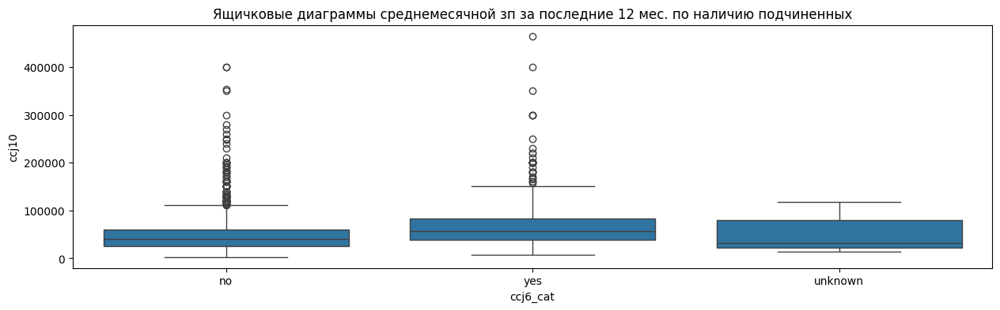

In [120]:
# Построим ящичковые диаграммы распределения зп по наличию подчиненных
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj6_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Ящичковые диаграммы среднемесячной зп за последние 12 мес. по наличию подчиненных')
plt.xlabel('ccj6_cat')
plt.ylabel('ccj10')
plt.show();

In [121]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах ccj6_cat
df.pivot_table(index=['ccj6_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj6_cat,,
no,4004,0.37
unknown,8,0.50
yes,804,0.17


В дальнейшем перед моделированием переменной применим OneHotEncoder.

##### **ccj6_0 (количество подчиненных)**

In [122]:
# Заполним пропуски 'unknown'
df.loc[df['ccj6_cat']=='no', 'ccj6_0'] = 0
df.loc[df['ccj6_0'].isnull()==True, 'ccj6_0'] = 'unknown'
df.loc[df['ccj6_0'] == 99999997, 'ccj6_0'] = 'unknown'
df.loc[df['ccj6_0'] == 99999998, 'ccj6_0'] = 'unknown'
df.loc[df['ccj6_0'] == 99999999, 'ccj6_0'] = 'unknown'
# Выведим содержимое столбца ccj6_cat
print(df['ccj6_0'].value_counts())

ccj6_0
0.00        4004
2.00         103
3.00          82
5.00          82
1.00          81
4.00          67
10.00         58
6.00          55
15.00         36
8.00          29
20.00         22
7.00          20
12.00         20
 unknown      19
30.00         18
40.00         17
9.00          13
25.00          8
18.00          8
14.00          6
50.00          6
16.00          5
11.00          4
60.00          4
24.00          3
17.00          3
100.00         3
45.00          3
19.00          2
21.00          2
23.00          2
49.00          2
35.00          2
37.00          2
28.00          2
150.00         2
200.00         2
22.00          1
300.00         1
36.00          1
56.00          1
90.00          1
1,218.00       1
31.00          1
26.00          1
58.00          1
130.00         1
27.00          1
13.00          1
210.00         1
32.00          1
54.00          1
116.00         1
52.00          1
900.00         1
34.00          1
Name: count, dtype: int64


In [123]:
# Проверка
df[df['ccj6_0'].isnull()==True].shape[0]

0

In [124]:
# Проверка
df[df['ccj6_0']=='unknown'].shape[0]

19

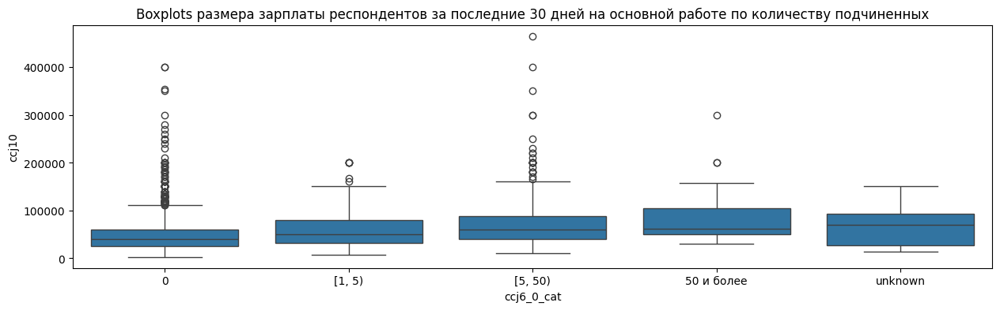

In [125]:
# Категаризуем переменную ccj6_0
def categorize_empl_cnt(row):
    """Функция категоризации ccj6_0"""
    try:
        if row['ccj6_0']==0:
            return '0'
        elif row['ccj6_0']<5:
            return '[1, 5)'
        elif row['ccj6_0']<50:
            return '[5, 50)'
        elif row['ccj6_0']>=50:
             return '50 и более'
    except:
        return 'unknown'

# Создадим категоризованный столбец ccj6_0_cat
df['ccj6_0_cat']  = df.apply(categorize_empl_cnt, axis=1)
order = ['0', '[1, 5)', '[5, 50)', '50 и более', 'unknown']
# Построим ящичковые диаграммы распределения зп по стажу
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj6_0_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по количеству подчиненных')
plt.xlabel('ccj6_0_cat')
plt.ylabel('ccj10')
plt.show();

In [126]:
# Выведим содержимое столбца ccj6_0_cat
print(df['ccj6_0_cat'].value_counts())

ccj6_0_cat
0             4004
[5, 50)        432
[1, 5)         333
50 и более      28
unknown         19
Name: count, dtype: int64


In [127]:
# Удалим столбец
del df['ccj6_0']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах ccj6_cat
df.pivot_table(index=['ccj6_0_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj6_0_cat,,
0,4004,0.37
50 и более,28,0.07
"[1, 5)",333,0.23
"[5, 50)",432,0.12
unknown,19,0.26


В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **ccj11 (тип занятости)**

In [128]:
# Категоризуем итогово переменную ccj11
df['ccj11_cat'] = df['ccj11'].map(ccj11_d)
# Заполним пропуски
df.loc[df['ccj11'].isnull()==True, 'ccj11_cat'] = 'unknown'
# Удалим переменную ccj11
del df['ccj11']
# Выведим содержимое столбца ccj11
print(df['ccj11_cat'].value_counts())

ccj11_cat
enterprise        4257
not_enterprise     359
self_employed      105
individual          89
unknown              6
Name: count, dtype: int64


In [129]:
# Проверка
df[df['ccj11_cat'].isnull()==True].shape[0]

0

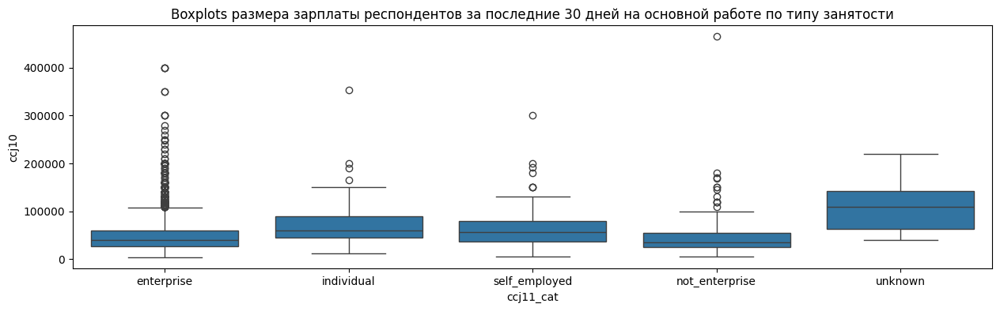

In [130]:
# Построим ящичковые диаграммы распределения зп по типу занятости
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj11_cat', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по типу занятости')
plt.xlabel('ccj11_cat')
plt.ylabel('ccj10')
plt.show();

In [131]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах ccj11_cat
df.pivot_table(index=['ccj11_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj11_cat,,
enterprise,4257,0.34
individual,89,0.10
not_enterprise,359,0.43
self_employed,105,0.21
unknown,6,0.00


В дальнейшем перед моделированием переменной применим LeaveOneOutEncoder.

##### **ccj13 (численность сотрудников)**

In [132]:
# Заполним пропуски 'unknown'
df.loc[df['ccj13'].isnull()==True, 'ccj13'] = 'unknown'
df.loc[df['ccj13'] == 99999997, 'ccj13'] = 'unknown'
df.loc[df['ccj13'] == 99999998, 'ccj13'] = 'unknown'
df.loc[df['ccj13'] == 99999999, 'ccj13'] = 'unknown'
# Выведим содержимое столбца ccj13
print(df['ccj13'].value_counts())

ccj13
 unknown      1626
97.00          225
30.00          179
20.00          172
50.00          155
              ... 
1,050.00         1
88.00            1
290.00           1
300,000.00       1
100,000.00       1
Name: count, Length: 190, dtype: int64


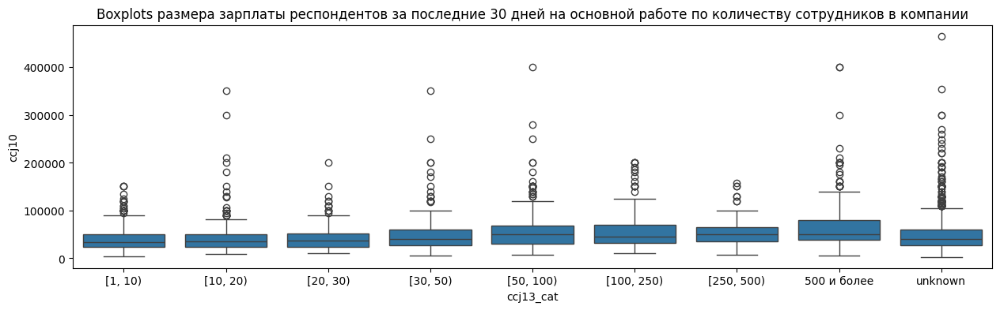

In [133]:
# Категаризуем переменную ccj13
def categorize_empl_cnt_in_company(row):
    """Функция категоризации ccj13"""
    try:
        if row['ccj13']<10:
            return '[1, 10)'
        elif row['ccj13']<20:
            return '[10, 20)'
        elif row['ccj13']<30:
            return '[20, 30)'
        elif row['ccj13']<50:
            return '[30, 50)'
        elif row['ccj13']<100:
            return '[50, 100)'
        elif row['ccj13']<250:
            return '[100, 250)'
        elif row['ccj13']<500:
            return '[250, 500)'
        elif row['ccj13']>=500:
             return '500 и более'
    except:
        return 'unknown'

# Создадим категоризованный столбец ccj13_cat
df['ccj13_cat']  = df.apply(categorize_empl_cnt_in_company, axis=1)
order = ['[1, 10)', '[10, 20)', '[20, 30)', '[30, 50)', '[50, 100)', '[100, 250)', '[250, 500)', '500 и более', 'unknown']
# Построим ящичковые диаграммы распределения зп по размеру компании
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj13_cat', y='ccj10', data=df, orientation='vertical', order=order)
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по количеству сотрудников в компании')
plt.xlabel('ccj13_cat')
plt.ylabel('ccj10')
plt.show();

In [134]:
# Удалим переменную ccj13
del df['ccj13']
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах ccj13_cat
df.pivot_table(index=['ccj13_cat'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj13_cat,,
500 и более,393,0.15
"[1, 10)",509,0.48
"[10, 20)",429,0.46
"[100, 250)",370,0.24
"[20, 30)",302,0.41
"[250, 500)",154,0.21
"[30, 50)",427,0.37
"[50, 100)",606,0.28
unknown,1626,0.35


##### **ccj23 (госучастие)**

In [135]:
# Заполним пропуски 'unknown'
df.loc[df['ccj23'].isnull()==True, 'ccj23'] = 'unknown'
df.loc[df['ccj23'] == 99999997, 'ccj23'] = 'unknown'
df.loc[df['ccj23'] == 99999998, 'ccj23'] = 'unknown'
df.loc[df['ccj23'] == 99999999, 'ccj23'] = 'unknown'
# Категоризуем
df.loc[df['ccj23'] == 1, 'ccj23'] = 'yes'
df.loc[df['ccj23'] == 2, 'ccj23'] = 'no'
# Выведим содержимое столбца ccj23
print(df['ccj23'].value_counts())

ccj23
no         2264
yes        1831
unknown     721
Name: count, dtype: int64


In [136]:
# Проверка
df[df['ccj23'].isnull()==True].shape[0]

0

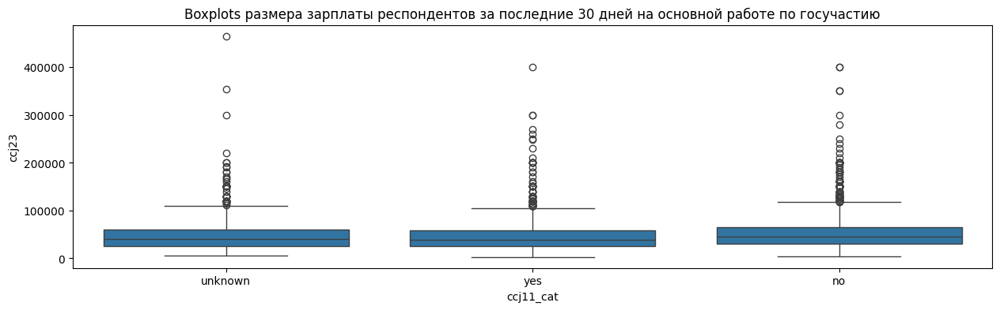

In [137]:
# Построим ящичковые диаграммы распределения зп по госучастию
plt.figure(figsize=(15, 4))
sns.boxplot(x='ccj23', y='ccj10', data=df, orientation='vertical')
plt.title('Boxplots размера зарплаты респондентов за последние 30 дней на основной работе по госучастию')
plt.xlabel('ccj11_cat')
plt.ylabel('ccj23')
plt.show();

In [138]:
# Подсчитаем количество людей, долю людей с зп менее 30 тыс. руб. в группах ccj23
df.pivot_table(index=['ccj23'], values='ccj10_cat', aggfunc=('mean', 'count'))

,count,mean
ccj23,,
no,2264,0.28
unknown,721,0.37
yes,1831,0.40


##### **Итоги изучения и предобработки фичей**

In [139]:
df.head()

,ccid_i,ccj262,cc_occup08,ccj4_1,ccj23,ccj10,ccj10_cat,cch5_cat,cc_age_cat,cc_marst_cat,ccj72_171_cat,ccj72_172_cat,ccj72_173_cat,cc_diplom_cat,diplom_years,ccj260_cat,exp_cat,exp_curr_cat,ccj6_2_cat,status_cat,ccj6_cat,ccj6_0_cat,ccj11_cat,ccj13_cat
3,"1,010,801.00",4.00,5.00,2.00,unknown,"22,000.00",1,female,60 и более,married,yes,3 и более,0,no,11,no,"[40, 50)","[1, 3)",unknown,village,no,0,enterprise,"[100, 250)"
4,"1,010,802.00",4.00,5.00,2.00,yes,"50,000.00",0,male,"[50, 60)",married,yes,3 и более,0,no,11,no,"[30, 40)",менее 1,"[40, 50)",village,no,0,enterprise,unknown
9,"9,000,503.00",3.00,3.00,11.00,yes,"45,000.00",0,female,"[30, 40)",married,yes,менее 2,1-2,yes,16,yes,"[10, 20)","[1, 3)","[30, 40)",center_area,no,0,enterprise,"[20, 30)"
12,"9,005,501.00",4.00,5.00,14.00,unknown,"60,000.00",0,female,"[50, 60)",not_married,yes,2,0,no,13,no,"[30, 40)","[30, 40)","[30, 40)",center_area,no,0,individual,unknown
13,"9,005,503.00",3.00,2.00,21.00,unknown,"60,000.00",0,male,"[40, 50)",not_married,no,менее 2,0,yes,16,yes,"[10, 20)","[1, 3)","[30, 40)",center_area,no,0,self_employed,unknown


In [140]:
# Удалим столбцы
del df['ccid_i'] # id
del df['ccj10'] # не категоризированный таргет

In [141]:
# Удаление пропусков
df = df[df['cc_marst_cat']!='unknown']
df = df[df['ccj72_171_cat']!='unknown']
df = df[df['ccj72_172_cat']!='unknown']
df = df[df['ccj72_173_cat']!='unknown']
df = df[df['cc_diplom_cat']!='unknown']
df = df[df['diplom_years']!='unknown']
df = df[df['ccj260_cat']!='unknown']
df = df[df['ccj262']!='unknown']
df = df[df['exp_cat']!='unknown']
df = df[df['exp_curr_cat']!='unknown']
df = df[df['cc_occup08']!='unknown']
df = df[df['ccj6_2_cat']!='unknown']
df = df[df['ccj4_1']!='unknown']
df = df[df['ccj6_cat']!='unknown']
df = df[df['ccj6_0_cat']!='unknown']
df = df[df['ccj11_cat']!='unknown']
df = df[df['ccj13_cat']!='unknown']
df = df[df['ccj23']!='unknown']
# Доп фильтрация по возрасту
df = df[df['cc_age_cat']!='60 и более']
# Выведим общую информацию о датафрейме
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2442 entries, 9 to 11997
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ccj262         2442 non-null   object
 1   cc_occup08     2442 non-null   object
 2   ccj4_1         2442 non-null   object
 3   ccj23          2442 non-null   object
 4   ccj10_cat      2442 non-null   int64 
 5   cch5_cat       2442 non-null   object
 6   cc_age_cat     2442 non-null   object
 7   cc_marst_cat   2442 non-null   object
 8   ccj72_171_cat  2442 non-null   object
 9   ccj72_172_cat  2442 non-null   object
 10  ccj72_173_cat  2442 non-null   object
 11  cc_diplom_cat  2442 non-null   object
 12  diplom_years   2442 non-null   object
 13  ccj260_cat     2442 non-null   object
 14  exp_cat        2442 non-null   object
 15  exp_curr_cat   2442 non-null   object
 16  ccj6_2_cat     2442 non-null   object
 17  status_cat     2442 non-null   object
 18  ccj6_cat       2442 non-null   o

Итак, первоначально датасет содержал  данные о 12 тыс респондентов. Поскольку цель - построить модель прогноза заработной платы за последние 30 дней, то из датасета были удалены:
 - не имеющие работу (ccj77==1),
 - инвалиды (ccm20_7==2)),
 - ученики, пенсионеры, студенты, ... (ccj90>=10&ccj90<=13),
 - ненадежные ответы респондентов (ccs7==1),
 - не указавшие размер заработной платы за последние 30 дней (ccj10!=unknown),
 - респонденты в возрасте 60 и более лет (cc_age<60),
 - пропуски по фичам:

|Фичи|Пропуски|
|------|------|
|cch5_cat (Пол респондента)|Нет|
|cc_age_cat (Возраст респондента)|Нет|
|cc_marst_cat (Семейное положение)|Есть (категория 'unknown'-14)|
|ccj72_171_cat (есть ли дети)|Есть (категория 'unknown'-3)|
|ccj72_172_cat  (количество детей)|Есть (категория 'unknown'-4)|
|ccj72_173_cat  (количество детей моложе 18)|Есть (категория 'unknown'-7)|
|cc_diplom_cat (законченное высшее образование и выше)|Есть (категория 'unknown'-17)|
|diplom_years (количество лет образования)|Есть (категория 'unknown'-17)|
|ccj260_cat (владение иностранным языком)|Есть (категория 'unknown'-40)|
|ccj262 (степень владения иностранным языком)|Есть (категория 'unknown'-37)|
|exp_cat (стаж всего, лет)|Есть (категория 'unknown'-283)|
|exp_curr_cat (стаж на текущем месте работы, лет)|Есть (категория 'unknown'-27)|
|ccj6_2_cat (продолжительность рабочей недели в часах)|Есть (категория 'unknown'-518)|
|status_cat (тип населенного пункта)|Нет|
|cc_occup08 (профессиональная группа)|Есть (категория 'unknown'-18)|
|ccj4_1 (отрасль)|Есть (категория 'unknown'-29)|
|ccj6_cat (наличие подчиненных)|Есть (категория 'unknown'-8)|
|ccj6_0_cat (количество подчиненных)|Есть (категория 'unknown'-19)|
|ccj11_cat (тип занятости)|Есть (категория 'unknown'-6)|
|ccj13_cat (численность сотрудников)|Есть (категория 'unknown'-1626)|
|ccj23_cat (госучастие)|Есть (категория 'unknown'-721)|

В результате, в итоговой выборке осталось 2442 респондента.

In [142]:
# Выведим первые 5 строк датафрейма
df.head()

,ccj262,cc_occup08,ccj4_1,ccj23,ccj10_cat,cch5_cat,cc_age_cat,cc_marst_cat,ccj72_171_cat,ccj72_172_cat,ccj72_173_cat,cc_diplom_cat,diplom_years,ccj260_cat,exp_cat,exp_curr_cat,ccj6_2_cat,status_cat,ccj6_cat,ccj6_0_cat,ccj11_cat,ccj13_cat
9,3.00,3.00,11.00,yes,0,female,"[30, 40)",married,yes,менее 2,1-2,yes,16,yes,"[10, 20)","[1, 3)","[30, 40)",center_area,no,0,enterprise,"[20, 30)"
16,3.00,2.00,10.00,no,0,female,"[50, 60)",married,yes,менее 2,0,yes,16,yes,"[30, 40)","[3, 6)","[30, 40)",center_area,no,0,enterprise,"[30, 50)"
20,4.00,5.00,12.00,yes,1,male,"[50, 60)",married,yes,2,0,yes,16,no,"[30, 40)","[10, 20)","[40, 50)",center_area,no,0,enterprise,"[50, 100)"
37,4.00,5.00,1.00,no,0,female,"[40, 50)",not_married,yes,2,1-2,no,11,no,"[20, 30)","[6, 10)","[40, 50)",city,no,0,enterprise,"[1, 10)"
48,3.00,9.00,5.00,no,1,female,"[50, 60)",not_married,no,менее 2,0,no,13,yes,"[30, 40)","[20, 30)","[30, 40)",city,no,0,enterprise,"[10, 20)"


#### **Разбиение выборки на train/validation/test, трансформация переменных**

In [143]:
%%time
# Закодируем дамми
low_cardinality_cols = ['cch5_cat', 'cc_marst_cat', 'ccj72_171_cat', 'cc_diplom_cat', 'ccj260_cat', 'ccj6_cat', 'status_cat', 'ccj23']

df_d = pd.get_dummies(df[low_cardinality_cols], drop_first=True)
bool_cols = df_d.select_dtypes(include=['bool']).columns
df_d[bool_cols] = df_d[bool_cols].astype(int) # приведем дамми к типу int

X = df.drop(low_cardinality_cols, axis=1)

new_df = pd.concat([X, df_d], axis=1)
# Выведим первые 5 строк датафрейма
new_df.head()

CPU times: user 19.3 ms, sys: 0 ns, total: 19.3 ms
Wall time: 46.3 ms


,ccj262,cc_occup08,ccj4_1,ccj10_cat,cc_age_cat,ccj72_172_cat,ccj72_173_cat,diplom_years,exp_cat,exp_curr_cat,ccj6_2_cat,ccj6_0_cat,ccj11_cat,ccj13_cat,cch5_cat_male,cc_marst_cat_not_married,ccj72_171_cat_yes,cc_diplom_cat_yes,ccj260_cat_yes,ccj6_cat_yes,status_cat_center_area_high,status_cat_city,status_cat_urban_village,status_cat_village,ccj23_yes
9,3.00,3.00,11.00,0,"[30, 40)",менее 2,1-2,16,"[10, 20)","[1, 3)","[30, 40)",0,enterprise,"[20, 30)",0,0,1,1,1,0,0,0,0,0,1
16,3.00,2.00,10.00,0,"[50, 60)",менее 2,0,16,"[30, 40)","[3, 6)","[30, 40)",0,enterprise,"[30, 50)",0,0,1,1,1,0,0,0,0,0,0
20,4.00,5.00,12.00,1,"[50, 60)",2,0,16,"[30, 40)","[10, 20)","[40, 50)",0,enterprise,"[50, 100)",1,0,1,1,0,0,0,0,0,0,1
37,4.00,5.00,1.00,0,"[40, 50)",2,1-2,11,"[20, 30)","[6, 10)","[40, 50)",0,enterprise,"[1, 10)",0,1,1,0,0,0,0,1,0,0,0
48,3.00,9.00,5.00,1,"[50, 60)",менее 2,0,13,"[30, 40)","[20, 30)","[30, 40)",0,enterprise,"[10, 20)",0,1,0,0,1,0,0,1,0,0,0


In [144]:
# Составим список дамми-столбцов
list_of_dummy = []
for v in new_df.columns:
  if v not in df.columns:
    list_of_dummy.append(v)
list_of_dummy

['cch5_cat_male',
 'cc_marst_cat_not_married',
 'ccj72_171_cat_yes',
 'cc_diplom_cat_yes',
 'ccj260_cat_yes',
 'ccj6_cat_yes',
 'status_cat_center_area_high',
 'status_cat_city',
 'status_cat_urban_village',
 'status_cat_village',
 'ccj23_yes']

Разобъем выборку в соотношении 3:1:1.

In [145]:
df_train, df_auxiliary = train_test_split(new_df, test_size=0.4, random_state=random_state)
df_valid, df_test = train_test_split(df_auxiliary, test_size=0.5, random_state=random_state)

Исследуем полученные выборки.

In [146]:
df_train.shape[0]/df.shape[0], df_valid.shape[0]/df.shape[0], df_test.shape[0]/df.shape[0]

(0.5999180999181, 0.19983619983619982, 0.20024570024570024)

Получили разбиение исходного df примерно в отношении 3:1:1.

In [147]:
print(f'Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на исходном датафрейме :{df['ccj10_cat'].mean()}')
print(f'Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на обучающей выборке:{df_train['ccj10_cat'].mean()}')
print(f'Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на валидационной выборке :{df_valid['ccj10_cat'].mean()}')
print(f'Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на тестовой выборке :{df_test['ccj10_cat'].mean()}')

Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на исходном датафрейме :0.30425880425880425
Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на обучающей выборке:0.3037542662116041
Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на валидационной выборке :0.2930327868852459
Доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. на тестовой выборке :0.3169734151329243


На всех полученных выборках сохраняется примерно одинаковая доля респондентов с зарплатой на основном месте работы ниже 30 тыс. руб. (30%). Все выборки будем считать репрезентативными генеральной совокупности.

In [148]:
%%time
# Применим LeaveOneOutEncoder
feach_leave_one_out = ['cc_age_cat', 'ccj72_172_cat', 'ccj72_173_cat', 'diplom_years', 'ccj262', 'exp_cat', 'ccj6_0_cat', 'exp_curr_cat', 'cc_occup08', 'ccj4_1', 'ccj11_cat', 'ccj13_cat',  'ccj6_2_cat']
LOO_encoder = LeaveOneOutEncoder(sigma=0.1, random_state=random_state)
LOO_cols_train = pd.DataFrame(LOO_encoder.fit_transform(df_train[feach_leave_one_out], df_train['ccj10_cat']))
LOO_cols_valid = pd.DataFrame(LOO_encoder.transform(df_valid[feach_leave_one_out]))
LOO_cols_test = pd.DataFrame(LOO_encoder.transform(df_test[feach_leave_one_out]))

LOO_cols_train.index = df_train.index
LOO_cols_valid.index = df_valid.index
LOO_cols_test.index = df_test.index

X_train = df_train.drop(feach_leave_one_out, axis=1)
X_valid = df_valid.drop(feach_leave_one_out, axis=1)
X_test = df_test.drop(feach_leave_one_out, axis=1)

new_df_train = pd.concat([X_train, LOO_cols_train], axis=1)
new_df_valid = pd.concat([X_valid, LOO_cols_valid], axis=1)
new_df_test = pd.concat([X_test, LOO_cols_test], axis=1)

# Стандартизация признаков (не дамми)
scaler = StandardScaler()
scaler.fit(new_df_train[feach_leave_one_out])
new_df_train[feach_leave_one_out] = scaler.transform(new_df_train[feach_leave_one_out])
new_df_valid[feach_leave_one_out] = scaler.transform(new_df_valid[feach_leave_one_out])
new_df_test[feach_leave_one_out] = scaler.transform(new_df_test[feach_leave_one_out])

# Выведим первые 5 строк обучающей выборки
new_df_train.head()

CPU times: user 290 ms, sys: 1.12 ms, total: 291 ms
Wall time: 332 ms


,ccj10_cat,cch5_cat_male,cc_marst_cat_not_married,ccj72_171_cat_yes,cc_diplom_cat_yes,ccj260_cat_yes,ccj6_cat_yes,status_cat_center_area_high,status_cat_city,status_cat_urban_village,status_cat_village,ccj23_yes,cc_age_cat,ccj72_172_cat,ccj72_173_cat,diplom_years,ccj262,exp_cat,ccj6_0_cat,exp_curr_cat,cc_occup08,ccj4_1,ccj11_cat,ccj13_cat,ccj6_2_cat
9262,0,1,1,1,0,0,0,0,0,0,1,0,-0.13,0.41,-0.77,0.14,0.95,0.62,0.40,0.22,-1.45,-1.81,0.08,-0.68,-0.35
3784,0,0,0,1,1,1,0,0,1,0,0,1,1.48,-1.58,-0.08,-0.81,-2.58,0.57,0.14,1.99,-0.38,1.83,1.61,-0.31,0.56
10280,0,1,0,1,0,0,0,0,0,0,1,0,0.72,-1.53,0.04,0.71,-0.24,1.59,1.51,-0.55,-0.60,-0.93,0.35,1.47,0.09
8359,0,0,0,1,0,0,1,0,0,0,0,1,-1.21,0.78,-0.43,0.02,0.33,0.13,-0.78,0.34,1.37,0.87,-0.26,1.02,0.15
5982,1,1,0,1,1,1,0,0,0,0,0,1,0.15,0.86,-1.15,-0.82,-1.37,-0.35,0.79,0.40,-0.43,0.93,2.60,-0.14,2.08


In [149]:
# Выведим первые 5 строк валидационной выборки
new_df_valid.head()

,ccj10_cat,cch5_cat_male,cc_marst_cat_not_married,ccj72_171_cat_yes,cc_diplom_cat_yes,ccj260_cat_yes,ccj6_cat_yes,status_cat_center_area_high,status_cat_city,status_cat_urban_village,status_cat_village,ccj23_yes,cc_age_cat,ccj72_172_cat,ccj72_173_cat,diplom_years,ccj262,exp_cat,ccj6_0_cat,exp_curr_cat,cc_occup08,ccj4_1,ccj11_cat,ccj13_cat,ccj6_2_cat
11745,0,1,1,0,1,0,0,0,1,0,0,1,-0.91,-0.07,0.61,-0.98,0.49,-0.48,0.41,-0.32,-1.57,-0.86,-0.00,-1.23,-0.19
3653,0,1,0,1,1,0,1,0,0,0,0,1,1.10,-0.44,0.61,-0.98,0.49,0.83,-2.18,-0.70,-0.23,-0.47,-0.00,-0.78,-0.19
1823,0,0,1,1,1,1,0,1,0,0,0,1,1.10,-0.07,0.61,-0.98,-2.48,0.83,0.41,-0.32,-0.23,-1.53,-0.00,-1.53,-0.19
11692,0,1,0,1,0,0,0,0,1,0,0,1,-0.91,-0.44,-0.92,1.04,0.49,-0.48,0.41,0.43,-0.85,1.36,-0.00,-0.29,-0.19
7831,0,1,0,1,0,0,0,0,1,0,0,0,-0.91,-0.07,-0.92,0.21,0.49,-0.29,0.41,-0.06,-0.85,-0.86,-0.00,0.23,-0.19


In [150]:
# Выведим первые 5 строк тестовой выборки
new_df_test.head()

,ccj10_cat,cch5_cat_male,cc_marst_cat_not_married,ccj72_171_cat_yes,cc_diplom_cat_yes,ccj260_cat_yes,ccj6_cat_yes,status_cat_center_area_high,status_cat_city,status_cat_urban_village,status_cat_village,ccj23_yes,cc_age_cat,ccj72_172_cat,ccj72_173_cat,diplom_years,ccj262,exp_cat,ccj6_0_cat,exp_curr_cat,cc_occup08,ccj4_1,ccj11_cat,ccj13_cat,ccj6_2_cat
3891,0,0,0,1,1,0,1,0,0,0,1,1,-0.01,-0.07,0.61,-0.98,0.49,-0.29,-2.18,-0.70,-1.16,1.81,-0.00,1.22,1.17
3952,0,0,0,1,1,0,0,0,0,0,0,0,-0.91,-0.07,-0.92,-0.98,0.49,-0.48,0.41,-0.32,0.32,-0.86,-0.00,0.23,-0.18
5390,1,0,1,0,0,0,0,0,1,0,0,0,-0.12,-0.07,0.61,0.83,0.49,2.89,0.41,-0.06,1.14,0.04,-0.00,1.05,-0.19
5990,0,0,0,1,1,0,0,0,0,0,0,0,-0.91,-0.44,-0.92,-0.98,0.49,0.76,0.41,-0.70,1.14,0.04,-0.00,1.22,-0.18
226,1,0,0,1,1,0,1,0,1,0,0,1,1.10,-0.44,0.61,-0.98,0.49,-0.29,-2.18,0.43,-1.16,0.09,-0.00,-0.78,-0.19


In [151]:
features_df_train = new_df_train.drop('ccj10_cat', axis=1) # извлекаем признаки
target_df_train = new_df_train['ccj10_cat'] # извлекаем целевой признак

features_df_valid = new_df_valid.drop('ccj10_cat', axis=1) # извлекаем признаки
target_df_valid = new_df_valid['ccj10_cat'] # извлекаем целевой признак

features_df_test = new_df_test.drop('ccj10_cat', axis=1) # извлекаем признаки
target_df_test = new_df_test['ccj10_cat'] # извлекаем целевой признак

In [152]:
# Выведим первые 5 строк фичей обучающей выборки
features_df_train.head()

,cch5_cat_male,cc_marst_cat_not_married,ccj72_171_cat_yes,cc_diplom_cat_yes,ccj260_cat_yes,ccj6_cat_yes,status_cat_center_area_high,status_cat_city,status_cat_urban_village,status_cat_village,ccj23_yes,cc_age_cat,ccj72_172_cat,ccj72_173_cat,diplom_years,ccj262,exp_cat,ccj6_0_cat,exp_curr_cat,cc_occup08,ccj4_1,ccj11_cat,ccj13_cat,ccj6_2_cat
9262,1,1,1,0,0,0,0,0,0,1,0,-0.13,0.41,-0.77,0.14,0.95,0.62,0.40,0.22,-1.45,-1.81,0.08,-0.68,-0.35
3784,0,0,1,1,1,0,0,1,0,0,1,1.48,-1.58,-0.08,-0.81,-2.58,0.57,0.14,1.99,-0.38,1.83,1.61,-0.31,0.56
10280,1,0,1,0,0,0,0,0,0,1,0,0.72,-1.53,0.04,0.71,-0.24,1.59,1.51,-0.55,-0.60,-0.93,0.35,1.47,0.09
8359,0,0,1,0,0,1,0,0,0,0,1,-1.21,0.78,-0.43,0.02,0.33,0.13,-0.78,0.34,1.37,0.87,-0.26,1.02,0.15
5982,1,0,1,1,1,0,0,0,0,0,1,0.15,0.86,-1.15,-0.82,-1.37,-0.35,0.79,0.40,-0.43,0.93,2.60,-0.14,2.08


Итак, часть фечей преобразовали в дамми, а другую часть трансформировали с помощью LeaveOneOutEncoder + StandardScaler. Подробнее о трансформации переменных [здесь](https://github.com/evgpat/ml_basics_course/tree/main/lesson_04).

#### **Подготовка к обучению (расчет Gini, корреляций на train)**

CPU times: user 2min 8s, sys: 649 ms, total: 2min 8s
Wall time: 2min 19s


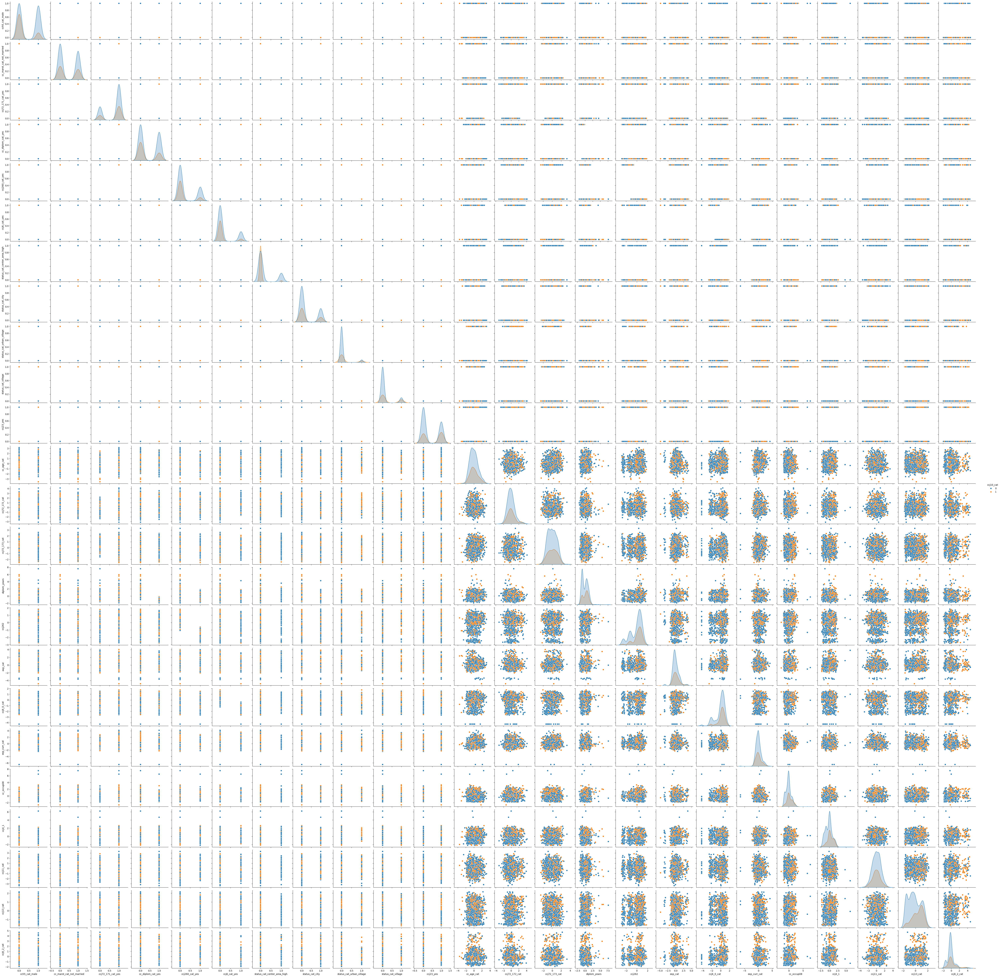

In [153]:
%%time
# Визуализируем признаки и таргет попарно на обучающей выборке
sns.pairplot(new_df_train,  hue='ccj10_cat')

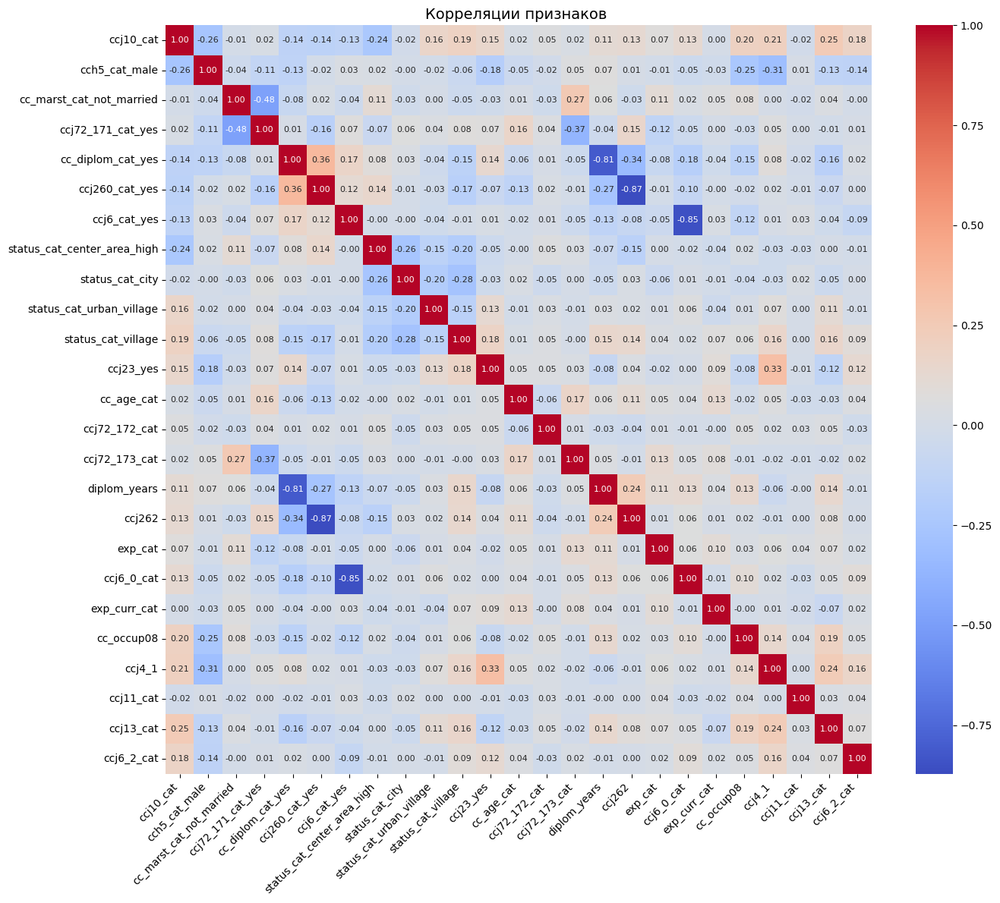

CPU times: user 1.68 s, sys: 41.7 ms, total: 1.73 s
Wall time: 1.78 s


In [154]:
%%time
# Построим парные корреляции Пирсона между признаками и таргетом на обучающем датасете
plt.figure(figsize=(14, 12))
corr = new_df_train.corr()
sns.heatmap(
    corr,
    annot=True,              # показываем значения
    fmt='.2f',               # 2 знака после запятой
    cmap='coolwarm',         # цветовая схема
    annot_kws={'size': 8}    # размер шрифта аннотаций
)
plt.title('Корреляции признаков ', fontsize=14)
plt.xticks(rotation=45, ha='right')  # поворот подписей по X
plt.yticks(rotation=0)               # подписи по Y горизонтально
plt.tight_layout()
plt.show();

cch5_cat_male
0.3617041198501872 -0.2765917602996256


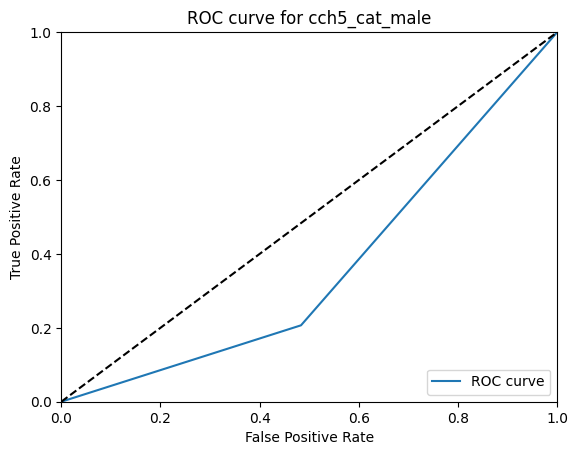

-----------------------------------------------------------------------------------------
cc_marst_cat_not_married
0.4964089006389073 -0.007182198722185396


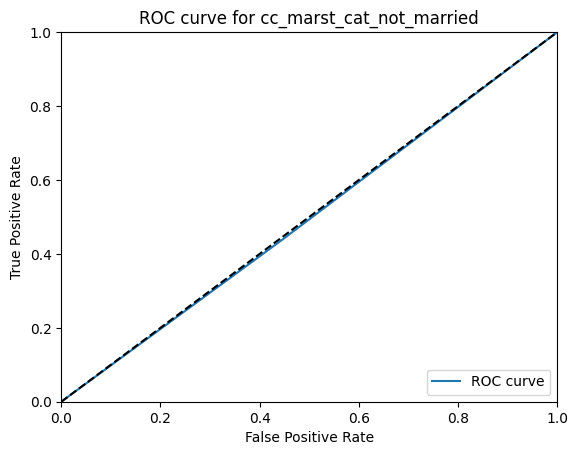

-----------------------------------------------------------------------------------------
ccj72_171_cat_yes
0.5076944260850408 0.015388852170081568


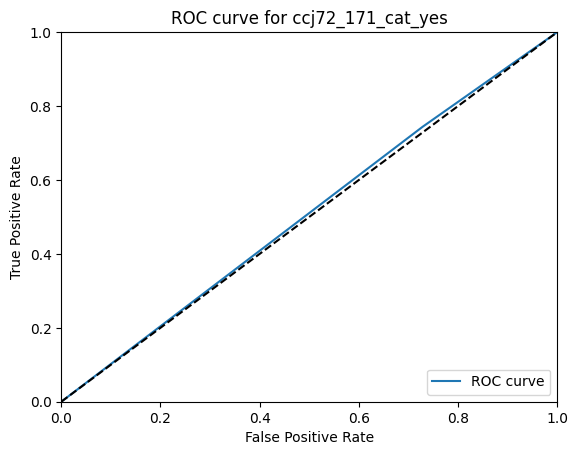

-----------------------------------------------------------------------------------------
cc_diplom_cat_yes
0.4266027759418374 -0.14679444811632525


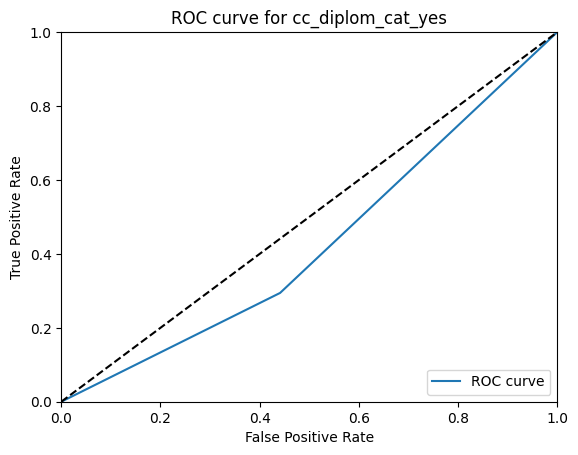

-----------------------------------------------------------------------------------------
ccj260_cat_yes
0.4333278255122273 -0.13334434897554537


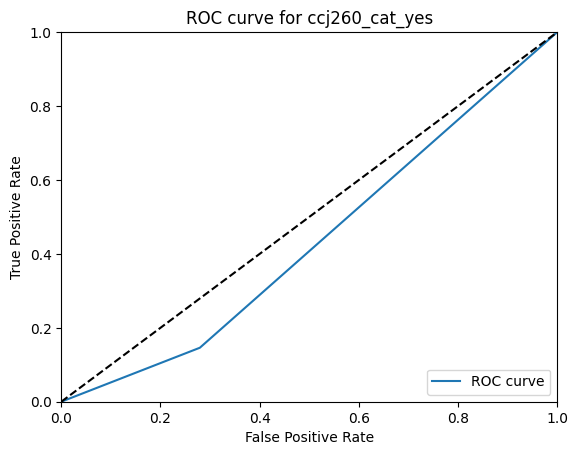

-----------------------------------------------------------------------------------------
ccj6_cat_yes
0.4446794448116325 -0.11064111037673496


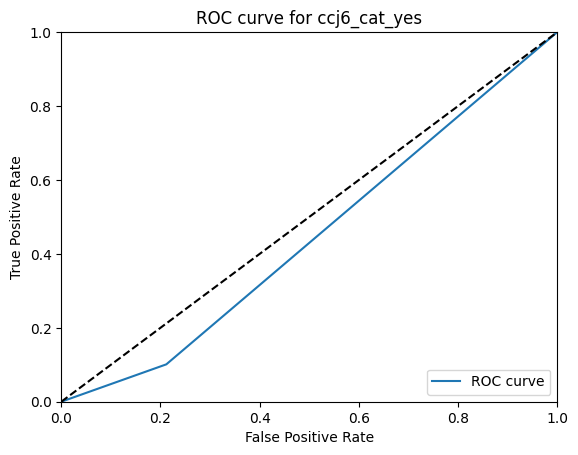

-----------------------------------------------------------------------------------------
status_cat_center_area_high
0.40465961665565103 -0.19068076668869793


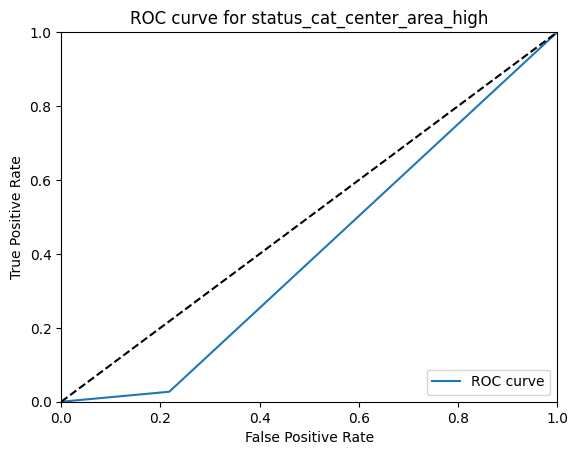

-----------------------------------------------------------------------------------------
status_cat_city
0.49083498567966516 -0.018330028640669682


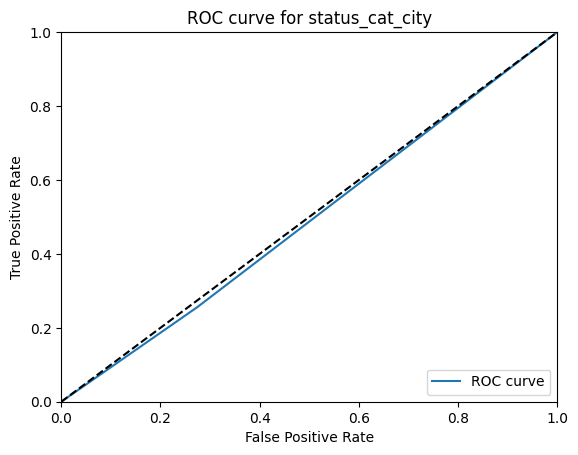

-----------------------------------------------------------------------------------------
status_cat_urban_village
0.5526933245208195 0.10538664904163908


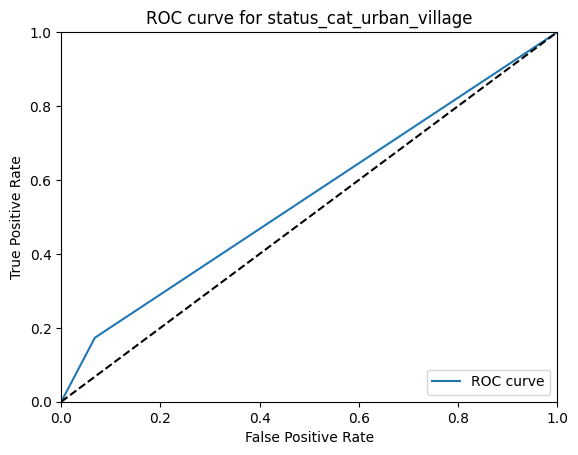

-----------------------------------------------------------------------------------------
status_cat_village
0.5793181317470808 0.1586362634941616


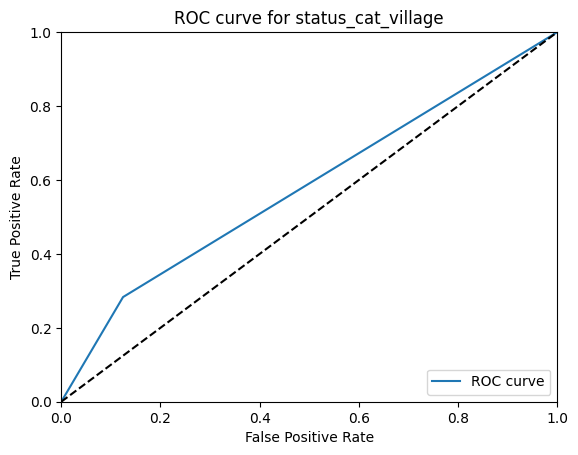

-----------------------------------------------------------------------------------------
ccj23_yes
0.5795274289491077 0.15905485789821538


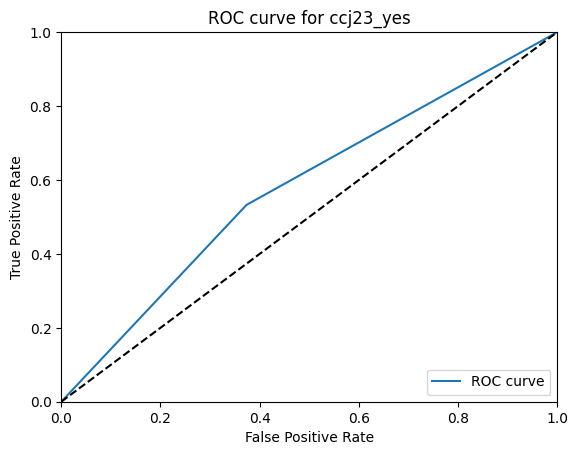

-----------------------------------------------------------------------------------------
cc_age_cat
0.5129477858559154 0.025895571711830767


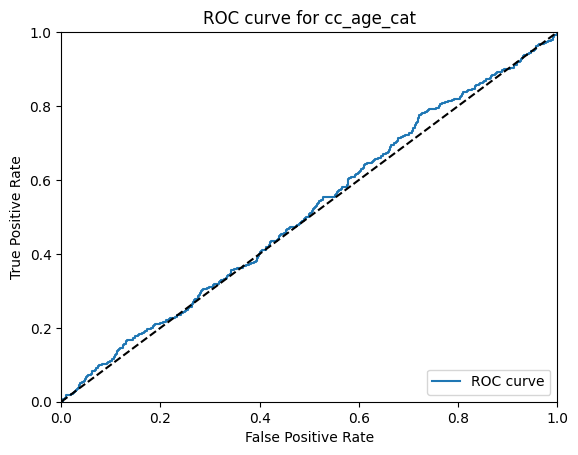

-----------------------------------------------------------------------------------------
ccj72_172_cat
0.5255937431152237 0.05118748623044733


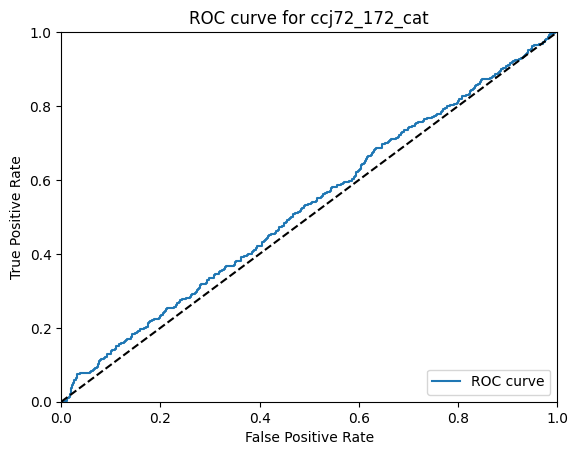

-----------------------------------------------------------------------------------------
ccj72_173_cat
0.5161555408680326 0.03231108173606523


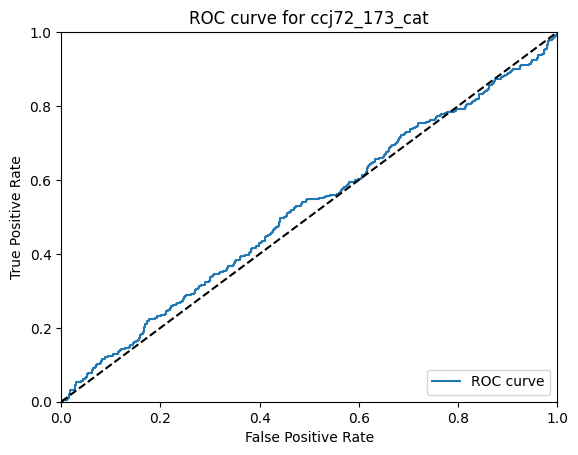

-----------------------------------------------------------------------------------------
diplom_years
0.5654042740691781 0.1308085481383563


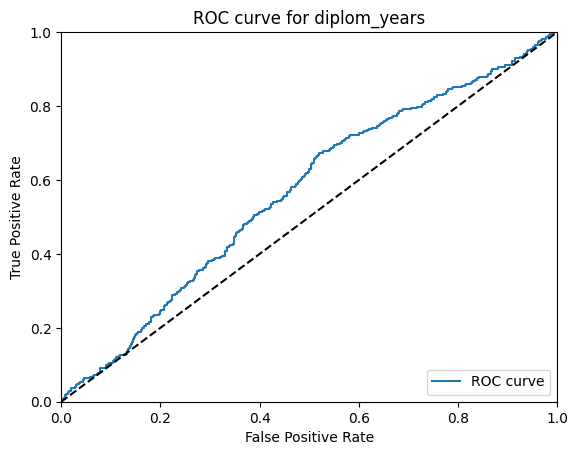

-----------------------------------------------------------------------------------------
ccj262
0.5618814716897995 0.12376294337959903


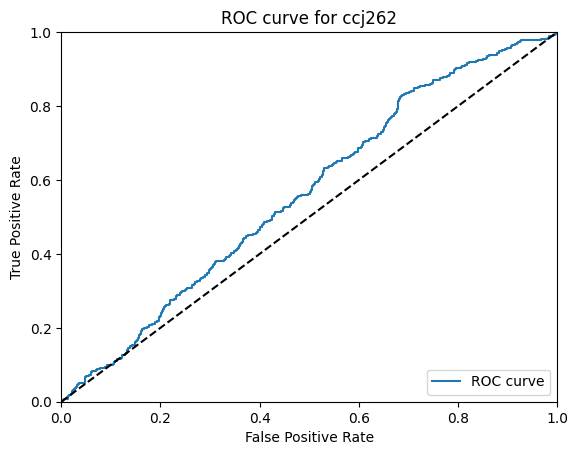

-----------------------------------------------------------------------------------------
exp_cat
0.5445494602335317 0.08909892046706336


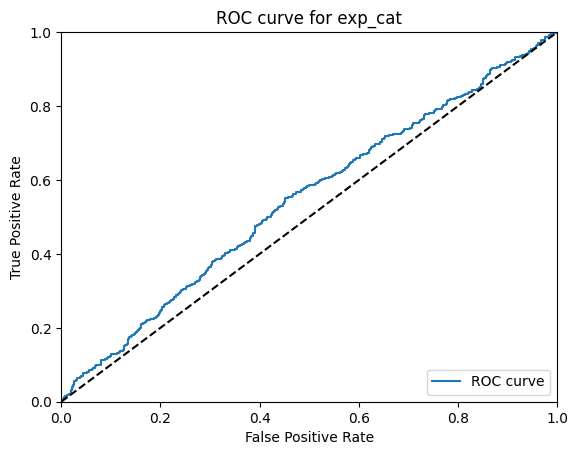

-----------------------------------------------------------------------------------------
ccj6_0_cat
0.5588499669530733 0.11769993390614664


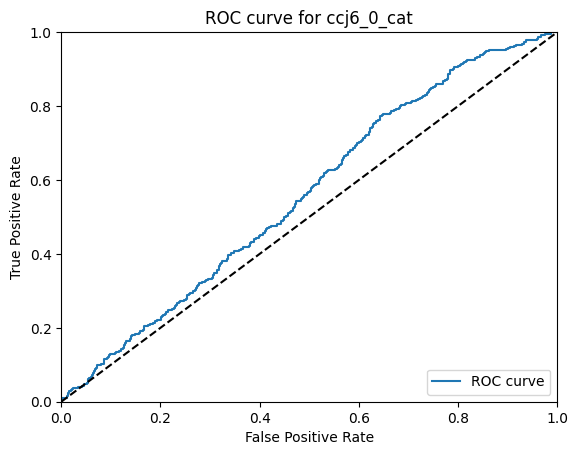

-----------------------------------------------------------------------------------------
exp_curr_cat
0.4919189248733201 -0.016162150253359764


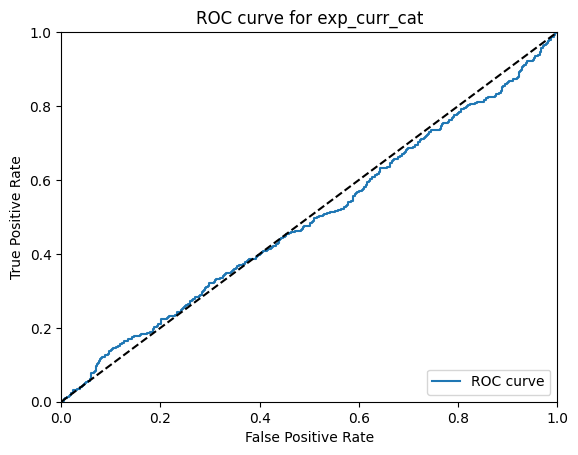

-----------------------------------------------------------------------------------------
cc_occup08
0.6236329588014982 0.24726591760299632


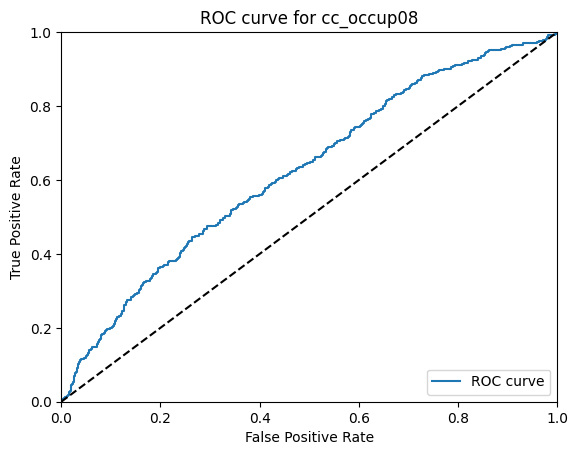

-----------------------------------------------------------------------------------------
ccj4_1
0.632956598369685 0.26591319673937


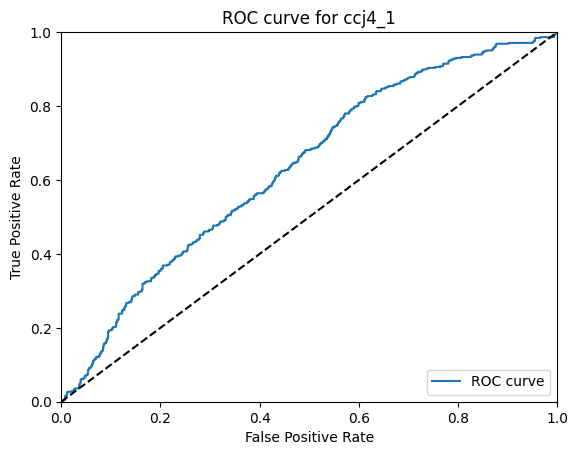

-----------------------------------------------------------------------------------------
ccj11_cat
0.4855232430050671 -0.028953513989865787


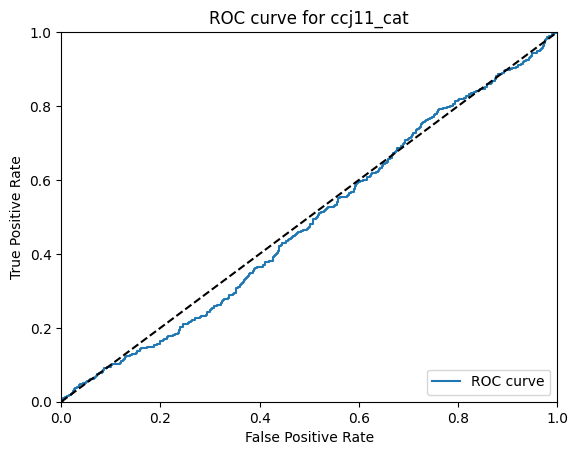

-----------------------------------------------------------------------------------------
ccj13_cat
0.657003745318352 0.3140074906367041


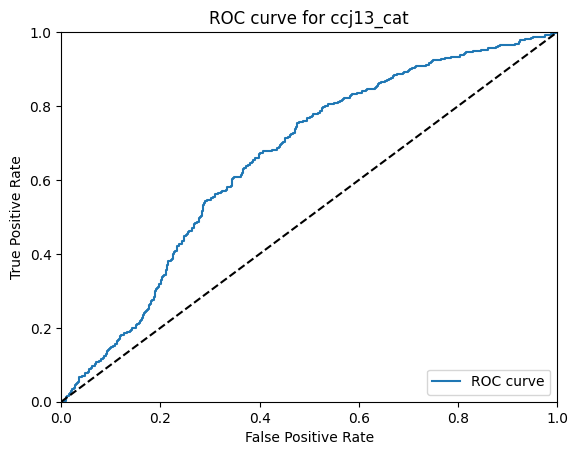

-----------------------------------------------------------------------------------------
ccj6_2_cat
0.5799140779907469 0.1598281559814938


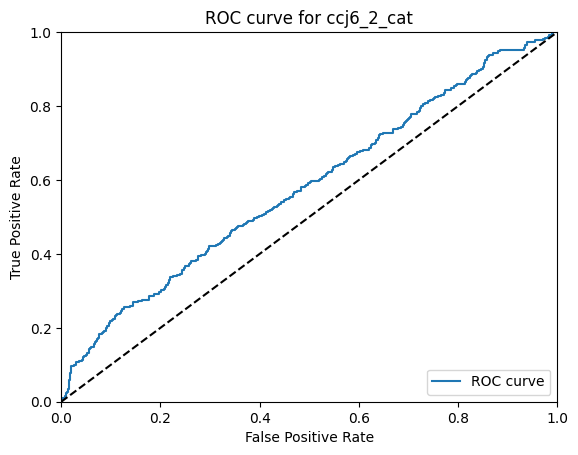

-----------------------------------------------------------------------------------------
CPU times: user 3.42 s, sys: 56.7 ms, total: 3.48 s
Wall time: 3.49 s


In [155]:
%%time
# Выведем график ROC curve и Gini на обучающей выборке
gini_dict={}
for v in new_df_train.columns[1:]:
  print(v)
  fpr_1, tpr_1, thresholds_1 = roc_curve(new_df_train['ccj10_cat'], new_df_train[f'{v}'])
  plt.plot(fpr_1, tpr_1, label='ROC curve')
  plt.plot([0, 1], [0, 1], 'k--') # random predictions curve
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'ROC curve for {v}')
  plt.legend(loc="lower right")
  auc_roc = roc_auc_score(new_df_train['ccj10_cat'], new_df_train[f'{v}'])
  print(auc_roc, 2*auc_roc-1)
  gini_dict[v]=2*auc_roc-1
  plt.show()
  print('-----------------------------------------------------------------------------------------')

#### **Обучение модели**

In [156]:
# Обучение логистической регрессии
lr = LogisticRegression(random_state=random_state, penalty='l1', class_weight='balanced', solver='liblinear')
lr.fit(features_df_train, target_df_train)

LogisticRegression(class_weight='balanced', penalty='l1', random_state=12345,
                   solver='liblinear')

In [157]:
predictions_prob_train = lr.predict_proba(X = features_df_train)[:,1]
predictions_prob_valid = lr.predict_proba(X = features_df_valid)[:,1]

--------Метрики качества на обучающей выборке--------
auc_roc_train:  0.8224895351398986
Gini_train:  0.6449790702797973
Accuracy_train:  0.7385665529010239
F1-мера_train:  0.6430568499534017
Precision_train:  0.5493630573248408
Recall_train:  0.7752808988764045
Confusion_matrix_train:  [[737 283]
 [100 345]]
--------Метрики качества на валидационной выборке--------
auc_roс_valid:  0.7877571703658661
Gini_valid:  0.5755143407317322
Accuracy_valid:  0.735655737704918
F1-мера_valid:  0.6239067055393586
Precision_valid:  0.535
Recall_valid:  0.7482517482517482
Confusion_matrix_valid:  [[252  93]
 [ 36 107]]


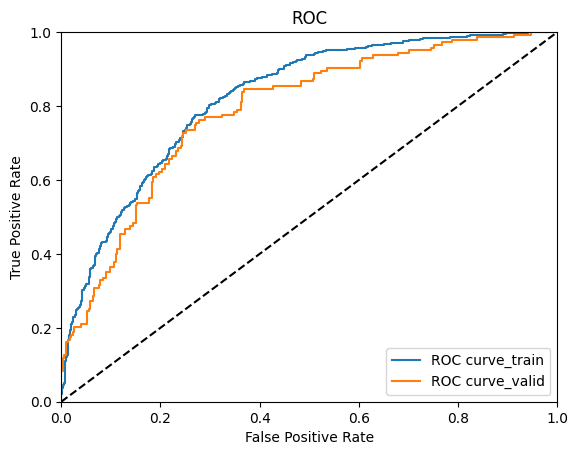

In [158]:
# Выведем график ROC curve и Gini, метрики качества модели на обучающей и валидационной выборках
fpr_1, tpr_1, thresholds_1 = roc_curve(target_df_train, predictions_prob_train)
fpr_2, tpr_2, thresholds_2 = roc_curve(target_df_valid, predictions_prob_valid)
plt.plot(fpr_1, tpr_1, label='ROC curve_train')
plt.plot(fpr_2, tpr_2, label='ROC curve_valid')
plt.plot([0, 1], [0, 1], 'k--')  # random predictions curve
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
print("--------Метрики качества на обучающей выборке--------")
auc_roc = roc_auc_score(target_df_train, predictions_prob_train)
print('auc_roc_train: ', auc_roc)
print('Gini_train: ', 2*auc_roc-1)
print('Accuracy_train: ', accuracy_score(target_df_train, lr.predict(features_df_train)))
print('F1-мера_train: ', f1_score(target_df_train, lr.predict(features_df_train)))
print('Precision_train: ', precision_score(target_df_train, lr.predict(features_df_train)))
print('Recall_train: ', recall_score(target_df_train, lr.predict(features_df_train)))
print('Confusion_matrix_train: ', confusion_matrix(target_df_train, lr.predict(features_df_train)))
print("--------Метрики качества на валидационной выборке--------")
auc_roc = roc_auc_score(target_df_valid, predictions_prob_valid)
print('auc_roс_valid: ', auc_roc)
print('Gini_valid: ',  2*auc_roc-1)
print('Accuracy_valid: ', accuracy_score(target_df_valid, lr.predict(features_df_valid)))
print('F1-мера_valid: ', f1_score(target_df_valid, lr.predict(features_df_valid)))
print('Precision_valid: ', precision_score(target_df_valid, lr.predict(features_df_valid)))
print('Recall_valid: ', recall_score(target_df_valid, lr.predict(features_df_valid)))
print('Confusion_matrix_valid: ', confusion_matrix(target_df_valid, lr.predict(features_df_valid)))

In [159]:
print('Коэффициенты модели:', lr.coef_)
print('Свободный член:', lr.intercept_)
print('Параметр С:', lr.C)

Коэффициенты модели: [[-1.13028722 -0.19175454 -0.24370835 -0.64094573 -0.44722468 -0.6231902
  -2.26710768 -0.05127582  0.67291924  0.32727578  0.44537195  0.0077363
   0.12511428  0.05627265 -0.12784481 -0.00906647  0.12420601 -0.03070538
  -0.02622974  0.24727506  0.11198589 -0.1059589   0.46284937  0.30985946]]
Свободный член: [0.85427387]
Параметр С: 1.0


#### **Подбор гиперпараметра C**

In [160]:
%%time
# На валидационной выборке подберем гипрпараметр C максимизирующий f1
c_range = np.linspace(0.001, 1, 2000)
param_grid = {'C': c_range}
gs = GridSearchCV(estimator = lr, cv = 10, param_grid = param_grid, scoring = 'f1')
gs.fit(X = features_df_train, y = target_df_train)
# Выведем подобранный на кросс-валидации C и макс f1
print('Best params: ' + str(gs.best_params_))
print('Best f1: {0:.3f}'.format(gs.best_score_))

Best params: {'C': np.float64(0.4842581290645322)}
Best f1: 0.629
CPU times: user 5min 52s, sys: 413 ms, total: 5min 53s
Wall time: 6min 5s


0.4842581290645322


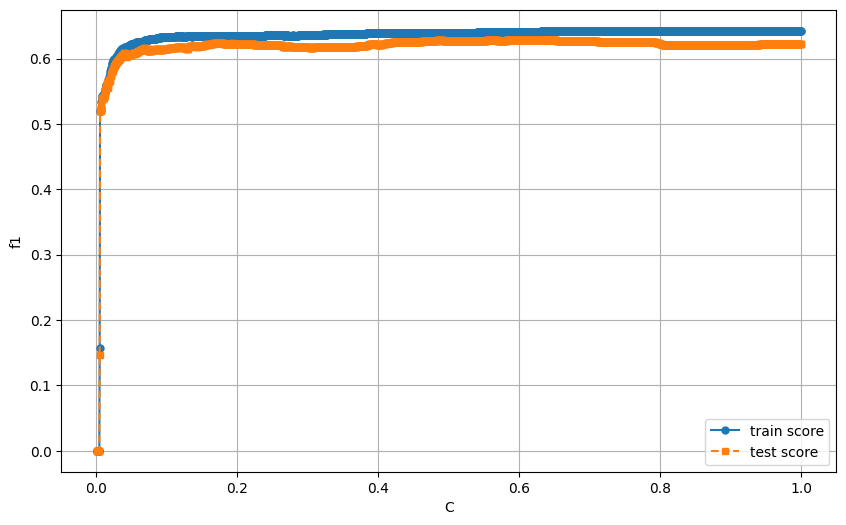

CPU times: user 7min 11s, sys: 369 ms, total: 7min 12s
Wall time: 7min 17s


In [185]:
%%time
# Построим график C/f1
train_scores, test_scores = validation_curve(
                estimator = lr, X = features_df_train, y = target_df_train,
                param_name ='C', cv = 10, param_range = c_range, scoring = 'f1')
train_mean = np.mean(train_scores, 1)
test_mean = np.mean(test_scores, 1)

print(c_range[np.argmax(test_mean)])

# Выведем график изменения f1 в зависимости от C
plt.figure(figsize=(10, 6))
plt.plot(c_range, train_mean, marker='o', markersize=5, label ='train score')
plt.plot(c_range, test_mean, marker='s', linestyle='--', markersize=5, label ='test score')
plt.grid()
plt.legend(loc = 'best')
plt.xlabel('C')
plt.ylabel('f1')
plt.show()

In [186]:
%%time
# Ручной вариант подбора гиперпараметра С
# Инициализация списков для метрик
accuracy_train = []
accuracy_valid = []
f1_train = []
f1_valid = []
recall_train = []
recall_valid = []
precision_train = []
precision_valid = []

# Инициализация словарей для коэффициентов
train_coef = {}
for i in range(0, len(features_df_train.columns)):
    train_coef[f'c_{i}_train'] = []

# Основной цикл по гиперпараметру C
for C_val in c_range:
    # Обучаем модель
    model = LogisticRegression(random_state=random_state,
                               penalty='l1',
                               C=C_val,
                               class_weight='balanced',
                               solver='liblinear')
    model.fit(features_df_train, target_df_train)

    # Предсказания для train и valid
    y_pred_train = model.predict(features_df_train)
    y_pred_valid = model.predict(features_df_valid)

    # Считаем метрики для train
    accuracy_train.append(accuracy_score(target_df_train, y_pred_train))
    f1_train.append(f1_score(target_df_train, y_pred_train))
    recall_train.append(recall_score(target_df_train, y_pred_train))
    precision_train.append(precision_score(target_df_train, y_pred_train))

    # Считаем метрики для valid
    accuracy_valid.append(accuracy_score(target_df_valid, y_pred_valid))
    f1_valid.append(f1_score(target_df_valid, y_pred_valid))
    recall_valid.append(recall_score(target_df_valid, y_pred_valid))
    precision_valid.append(precision_score(target_df_valid, y_pred_valid))

    # Сохраняем коэффициенты модели (для каждого признака)
    coef = model.coef_[0]

    for j in range(0, len(features_df_train.columns)):
        train_coef[f'c_{j}_train'].append(coef[j])

# Выведем лучшие С для различных метрик качества
print(c_range[np.argmax(f1_valid)])
print(c_range[np.argmax(accuracy_valid)])
print(c_range[np.argmax(recall_valid)])
print(c_range[np.argmax(precision_valid)])

0.2113946973486743
0.2113946973486743
0.00849624812406203
0.423288644322161
CPU times: user 1min 4s, sys: 67 ms, total: 1min 4s
Wall time: 1min 4s


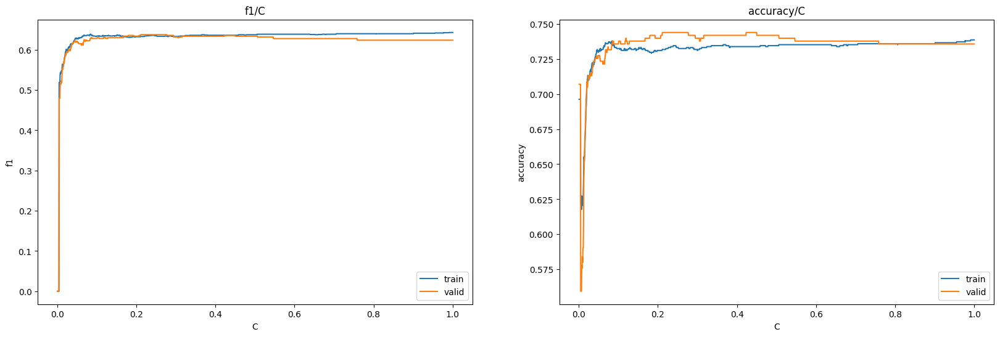

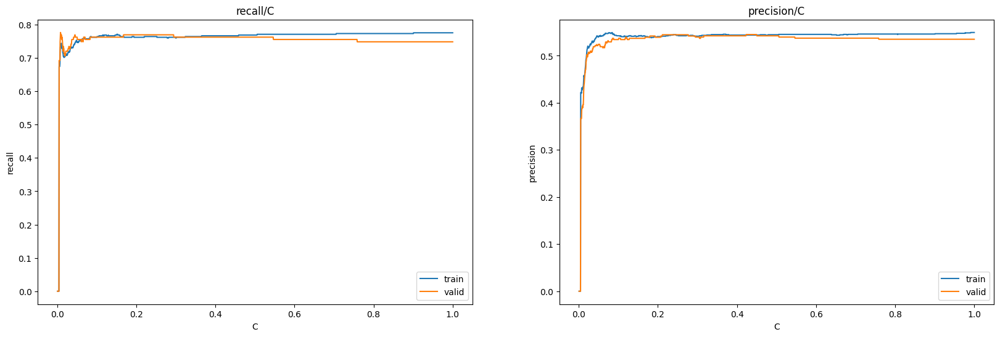

CPU times: user 643 ms, sys: 14 ms, total: 657 ms
Wall time: 659 ms


In [187]:
%%time
# Визуализируем метрики качества Лассо логистической регрессии в зависимости от гиперпараметра С
plt.figure(figsize=(20, 6))
plt.subplot(1,2,1)
plt.plot(c_range, f1_train, label = 'train')
plt.plot(c_range, f1_valid, label = 'valid')
plt.legend(loc='best')
plt.xlabel('С')
plt.ylabel('f1')
plt.title(f'f1/С')

plt.subplot(1,2,2)
plt.plot(c_range, accuracy_train, label = 'train')
plt.plot(c_range, accuracy_valid, label = 'valid')
plt.legend(loc='best')
plt.xlabel('С')
plt.ylabel('accuracy')
plt.title(f'accuracy/С')

plt.show()

plt.figure(figsize=(20, 6))
plt.subplot(1,2,1)
plt.plot(c_range, recall_train, label = 'train')
plt.plot(c_range , recall_valid, label = 'valid')
plt.legend(loc='best')
plt.xlabel('С')
plt.ylabel('recall')
plt.title(f'recall/С')

plt.subplot(1,2,2)
plt.plot(c_range, precision_train, label = 'train')
plt.plot(c_range, precision_valid, label = 'valid')
plt.legend(loc='best')
plt.xlabel('С')
plt.ylabel('precision')
plt.title(f'precision/С')

plt.show()

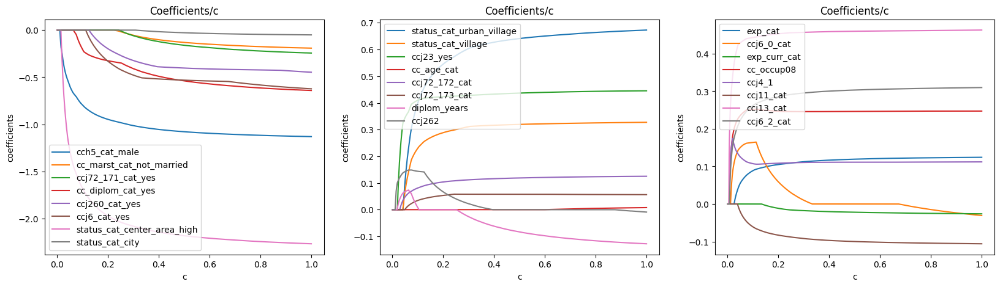

CPU times: user 1.35 s, sys: 15.9 ms, total: 1.36 s
Wall time: 2.5 s


In [200]:
%%time
# Визуализируем коэффициенты Лассо логистической регрессии в зависимости от гиперпараметра С
plt.figure(figsize=(20, 5))
plt.subplot(1,3,1)
for j in range(0, 8):
        x = features_df_train.columns[j]
        plt.plot(c_range, train_coef[f'c_{j}_train'], label = f'{x}')
        plt.legend(loc='best')
        plt.xlabel('с')
        plt.ylabel('coefficients')
        plt.legend(loc='best')
        plt.title(f'Coefficients/с')
plt.subplot(1,3,2)
for j in range(8, 16):
        x = features_df_train.columns[j]
        plt.plot(c_range, train_coef[f'c_{j}_train'], label = f'{x}')
        plt.legend(loc='best')
        plt.xlabel('с')
        plt.ylabel('coefficients')
        plt.legend(loc='best')
        plt.title(f'Coefficients/с')
plt.subplot(1,3,3)
for j in range(16,24):
        x = features_df_train.columns[j]
        plt.plot(c_range, train_coef[f'c_{j}_train'], label = f'{x}')
        plt.legend(loc='best')
        plt.xlabel('с')
        plt.ylabel('coefficients')
        plt.legend(loc='best')
        plt.title(f'Coefficients/с')
plt.show()

#### **Итоговая модель**

In [190]:
# Обучение лог регрессии
lr = LogisticRegression(random_state=random_state, penalty='l1', C=0.2113946973486743, class_weight='balanced', solver='liblinear')
lr.fit(features_df_train, target_df_train)

LogisticRegression(C=0.2113946973486743, class_weight='balanced', penalty='l1',
                   random_state=12345, solver='liblinear')

In [191]:
print('Коэффициенты модели', lr.coef_)
print('Свободный член', lr.intercept_)

Коэффициенты модели [[-0.95630625  0.          0.         -0.33144836 -0.21683546 -0.354417
  -1.99014568  0.          0.55360768  0.29157731  0.42404434  0.
   0.10512845  0.05440087  0.          0.05986196  0.10593332  0.05119978
  -0.01289255  0.24646624  0.10874562 -0.08434461  0.45364361  0.28754826]]
Свободный член [0.30176702]


--------Метрики качества на обучающей выборке--------
auc_roc_train:  0.8192773738708966
Gini_train:  0.6385547477417932
Accuracy_train:  0.731740614334471
F1-мера_train:  0.6330532212885154
Precision_train:  0.5415335463258786
Recall_train:  0.7617977528089888
Confusion_matrix_train:  [[733 287]
 [106 339]]
--------Метрики качества на валидационной выборке--------
auc_roс_valid:  0.7898854768419985
Gini_valid:  0.579770953683997
Accuracy_valid:  0.7438524590163934
F1-мера_valid:  0.6376811594202898
Precision_valid:  0.5445544554455446
Recall_valid:  0.7692307692307693
Confusion_matrix_valid:  [[253  92]
 [ 33 110]]
--------Метрики качества на тестовой выборке--------
auc_roс_test:  0.7840737879080548
Gini_test:  0.5681475758161096
Accuracy_test:  0.7034764826175869
F1-мера_test:  0.5915492957746479
Precision_test:  0.525
Recall_test:  0.6774193548387096
Confusion_matrix_test:  [[239  95]
 [ 50 105]]


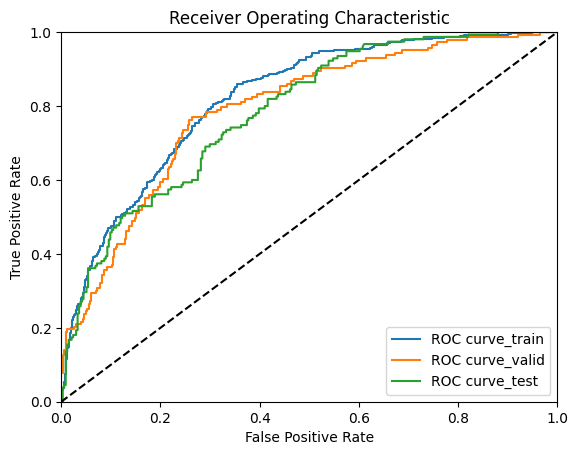

In [192]:
# Выведем график ROC curve и Gini, метрики качества модели на обучающей и валидационной выборках
predictions_prob_train = lr.predict_proba(X = features_df_train)[:,1]
predictions_prob_valid = lr.predict_proba(X = features_df_valid)[:,1]
predictions_prob_test = lr.predict_proba(X = features_df_test)[:,1]

fpr_1, tpr_1, thresholds_1 = roc_curve(target_df_train, predictions_prob_train)
fpr_2, tpr_2, thresholds_2 = roc_curve(target_df_valid, predictions_prob_valid)
fpr_3, tpr_3, thresholds_3 = roc_curve(target_df_test, predictions_prob_test)
plt.plot(fpr_1, tpr_1, label='ROC curve_train')
plt.plot(fpr_2, tpr_2, label='ROC curve_valid')
plt.plot(fpr_3, tpr_3, label='ROC curve_test')
plt.plot([0, 1], [0, 1], 'k--')  # random predictions curve
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
print("--------Метрики качества на обучающей выборке--------")
auc_roc = roc_auc_score(target_df_train, predictions_prob_train)
print('auc_roc_train: ', auc_roc)
print('Gini_train: ', 2*auc_roc-1)
print('Accuracy_train: ', accuracy_score(target_df_train, lr.predict(features_df_train)))
print('F1-мера_train: ', f1_score(target_df_train, lr.predict(features_df_train)))
print('Precision_train: ', precision_score(target_df_train, lr.predict(features_df_train)))
print('Recall_train: ', recall_score(target_df_train, lr.predict(features_df_train)))
print('Confusion_matrix_train: ', confusion_matrix(target_df_train, lr.predict(features_df_train)))
print("--------Метрики качества на валидационной выборке--------")
auc_roc = roc_auc_score(target_df_valid, predictions_prob_valid)
print('auc_roс_valid: ', auc_roc)
print('Gini_valid: ',  2*auc_roc-1)
print('Accuracy_valid: ', accuracy_score(target_df_valid, lr.predict(features_df_valid)))
print('F1-мера_valid: ', f1_score(target_df_valid, lr.predict(features_df_valid)))
print('Precision_valid: ', precision_score(target_df_valid, lr.predict(features_df_valid)))
print('Recall_valid: ', recall_score(target_df_valid, lr.predict(features_df_valid)))
print('Confusion_matrix_valid: ', confusion_matrix(target_df_valid, lr.predict(features_df_valid)))
print("--------Метрики качества на тестовой выборке--------")
auc_roc = roc_auc_score(target_df_test, predictions_prob_test)
print('auc_roс_test: ', auc_roc)
print('Gini_test: ',  2*auc_roc-1)
print('Accuracy_test: ', accuracy_score(target_df_test, lr.predict(features_df_test)))
print('F1-мера_test: ', f1_score(target_df_test, lr.predict(features_df_test)))
print('Precision_test: ', precision_score(target_df_test, lr.predict(features_df_test)))
print('Recall_test: ', recall_score(target_df_test, lr.predict(features_df_test)))
print('Confusion_matrix_test: ', confusion_matrix(target_df_test, lr.predict(features_df_test)))

Видим, что
 - F1-мера_train:0,63, F1-мера_valid:0,64, F1-мера_test:0.59. Переобучения нет, но качество модели среднее.
  - Из класса респондентов, получивших менее 30 тыс руб на основной работе за последние 30 дней, модель верно определила 68% (Recall), но из тех, кто отнесен моделью к классу получивших менее 30 тыс руб на основной работе за последние 30 дней, только 52,5% действительно являются таковыми (Precision).

Среднее качество модели можно объяснить следующим. На уровень заработной платы влияют множество других факторов (уровень интеллекта,  личностные качества и др.) кроме тех, которые включены в модель. Эти факторы отличаются от индивида к индивиду и во времени.  При измерении этих факторов возникают большие трудности и очень сложно добиться того, чтобы их можно было включить, к примеру, в обычную регрессионную модель. Однако пропуск этих переменных приведет к смещению в оценках.

In [193]:
# Выведем статистику по переменным (значение коэффициента в модели, коэффициент Gini на обучающей выборке)
feachures_name_dict = {'cch5_cat_male':'пол (дамми)',
                       'cc_marst_cat_not_married':'семейное положение (дамми)',
                       'ccj72_171_cat_yes':'есть ли дети (дамми)',
                       'cc_diplom_cat_yes':'наличие высшего образования (дамми)',
                       'ccj260_cat_yes':'владение иностранным языком (дамми)',
                       'ccj6_cat_yes':'наличие подчиненных (дамми)',
                       'status_cat_center_area_high':'областной центр (Москва, Владивосток, Красноярск) (дамми)',
                       'status_cat_city':'город (дамми)',
                       'status_cat_urban_village':'поселок городского типа (дамми)',
                       'status_cat_village':'село (дамми)',
                       'cc_age_cat':'возраст',
                       'ccj72_172_cat':'количество детей',
                       'ccj72_173_cat':'количество детей моложе 18',
                       'diplom_years':'количество лет образования',
                       'ccj262':'степень владение иностранным языком',
                       'exp_cat':'стаж',
                       'ccj6_0_cat':'количество подчиненных',
                       'exp_curr_cat':'стаж на текущем месте работы',
                       'cc_occup08':'профессиональная группа',
                       'ccj4_1':'отрасль',
                       'ccj11_cat':'тип занятости',
                       'ccj13_cat':'численность сотрудников',
                       'ccj23_yes':'госучастие (дамми)',
                       'ccj6_2_cat':'продолжительность рабочей недели в часа'}

weights = pd.Series(data=lr.coef_[0], index=features_df_train.columns)
gini = pd.Series(data=gini_dict)
feachures_name = pd.Series(data=feachures_name_dict)
weights = pd.concat([weights, gini, feachures_name], axis=1)
weights = weights.rename(columns={0:'coef', 1:'gini', 2:'feachure_name'})
# Положительные коэффициенты
weights[weights['coef']>0].sort_values(by = 'coef', ascending = False)

,coef,gini,feachure_name
status_cat_urban_village,0.55,0.11,поселок городского типа (дамми)
ccj13_cat,0.45,0.31,численность сотрудников
ccj23_yes,0.42,0.16,госучастие (дамми)
status_cat_village,0.29,0.16,село (дамми)
ccj6_2_cat,0.29,0.16,продолжительность рабочей недели в часа
cc_occup08,0.25,0.25,профессиональная группа
ccj4_1,0.11,0.27,отрасль
exp_cat,0.11,0.09,стаж
ccj72_172_cat,0.11,0.05,количество детей
ccj262,0.06,0.12,степень владение иностранным языком


In [194]:
# Отрицательные коэффициенты
weights[weights['coef']<0].sort_values(by = 'coef', ascending = True)

,coef,gini,feachure_name
status_cat_center_area_high,-1.99,-0.19,"областной центр (Москва, Владивосток, Краснояр..."
cch5_cat_male,-0.96,-0.28,пол (дамми)
ccj6_cat_yes,-0.35,-0.11,наличие подчиненных (дамми)
cc_diplom_cat_yes,-0.33,-0.15,наличие высшего образования (дамми)
ccj260_cat_yes,-0.22,-0.13,владение иностранным языком (дамми)
ccj11_cat,-0.08,-0.03,тип занятости
exp_curr_cat,-0.01,-0.02,стаж на текущем месте работы


In [195]:
# Нулевые коэффициенты
weights[weights['coef']==0]

,coef,gini,feachure_name
cc_marst_cat_not_married,0.00,-0.01,семейное положение (дамми)
ccj72_171_cat_yes,0.00,0.02,есть ли дети (дамми)
status_cat_city,0.00,-0.02,город (дамми)
cc_age_cat,0.00,0.03,возраст
diplom_years,0.00,0.13,количество лет образования


Далее можно разбить данные на кластеры, затем определить в каких кластерах больше всего ошибаемся, возможно это поможет улучшить модель. Также, чтобы более содержательно проитерпретировать взаимосвязь таргета и признаков можно использовать панельную выборку, собрав данные RLMS за несколько лет, и библиотеку PanelOLS.

## Используемые материалы

 - [Logistic regression Nedl](https://www.youtube.com/watch?v=51nHKDWIc9s&t=716s)
 - [ml_basics_course](https://github.com/evgpat/ml_basics_course)
 - [Тренировки по ML. Лекция 3: Линейная классификация, метод максимального правдоподобия](https://www.youtube.com/watch?v=R1ccYYpEpiA)
 - [hse-ds](https://github.com/hse-ds)